In [1]:
# 220210_1152
# Data : no 50, minmaxscalar로 rescale, image data generator 변경

In [2]:
pip install wandb --upgrade

Looking in indexes: https://pypi.org/simple, https://pip.repos.neuron.amazonaws.com
You should consider upgrading via the '/home/ubuntu/anaconda3/envs/tensorflow2_p37/bin/python -m pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.


In [353]:
%matplotlib inline

import os
from glob import glob
import pickle
from PIL import Image
import matplotlib.pyplot as plt
import cv2
import numpy as np
import pickle
#import nibabel as nib
import random
import math
import seaborn as sns

from sklearn.preprocessing import MinMaxScaler

from tensorflow.keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img
from tensorflow import keras

import wandb
from wandb.keras import WandbCallback

In [5]:
wandb.login()

Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Currently logged in as: sjeom (use `wandb login --relogin` to force relogin)


True

## 2. Extracting MRI pixel array: using INDEX in #1

### Load CT1, T2 data

In [64]:
# Load CT1 data
sev_gbm_dir_ct1 = glob(os.path.join(sev_dir, 'GBM', '*/CT1_r2s_bet_reg_znormed.nii.gz'))
sev_meta_dir_ct1 = glob(os.path.join(sev_dir, 'meta', '*/CT1_r2s_bet_reg_znormed.nii.gz'))

asan_gbm_dir_ct1 = glob(os.path.join(asan_dir, 'GBM', '*/CT1_r2s_bet_reg_znormed.nii.gz'))
asan_meta_dir_ct1 = glob(os.path.join(asan_dir, 'meta', '*/CT1_r2s_bet_reg_znormed.nii.gz'))

In [7]:
# Load T2 data
'''
sev_gbm_dir_t2 = glob(os.path.join(sev_dir, 'GBM', '*/T2_r2s_bet_reg_znormed.nii.gz'))
sev_meta_dir_t2 = glob(os.path.join(sev_dir, 'meta', '*/T2_r2s_bet_reg_znormed.nii.gz'))
'''
asan_gbm_dir_t2 = glob(os.path.join(asan_dir, 'GBM', '*/T2_r2s_bet_reg_znormed.nii.gz'))
asan_meta_dir_t2 = glob(os.path.join(asan_dir, 'meta', '*/T2_r2s_bet_reg_znormed.nii.gz'))

### Internal data
Split into train/validation/test data

In [5]:
def get_array(sliced_path, file_index, index_cut):
    data = []

    for index, mri in enumerate(sliced_path):
        load = nib.load(mri)
        array = load.get_fdata()
        index_ = index + index_cut #due to data split

        for i in file_index[index_]:
            mri_array = array[:,:,i]
            data.append(mri_array) #need to resize
    
    return data

#### CT1

In [10]:
'''
#train_gbm
sev_gbm = sev_gbm_dir_ct1[:241]
x_train_gbm = get_array(sev_gbm, sev_gbm_index, 0)

#val_gbm
sev_gbm_2 = sev_gbm_dir_ct1[241:268]
x_val_gbm = get_array(sev_gbm_2, sev_gbm_index, 241)

#test_gbm
sev_gbm_3 = sev_gbm_dir_ct1[268:]
x_test_gbm = get_array(sev_gbm_3, sev_gbm_index, 268)
'''

In [11]:
'''
#train_meta
sev_meta = sev_meta_dir_ct1[:118]
x_train_meta = get_array(sev_meta, sev_meta_index, 0)

#val_meta
sev_meta_2 = sev_meta_dir_ct1[118:131]
x_val_meta = get_array(sev_meta_2, sev_meta_index, 118)

#test_meta
sev_meta_3 = sev_meta_dir_ct1[131:]
x_test_meta = get_array(sev_meta_3, sev_meta_index, 131)
'''

#### T2

In [14]:
'''
#train_gbm
sev_gbm = sev_gbm_dir_t2[:241]
x_train_gbm_t2 = get_array(sev_gbm, sev_gbm_index, 0)

#val_gbm
sev_gbm_2 = sev_gbm_dir_t2[241:268]
x_val_gbm_t2 = get_array(sev_gbm_2, sev_gbm_index, 241)

#test_gbm
sev_gbm_3 = sev_gbm_dir_t2[268:]
x_test_gbm_t2 = get_array(sev_gbm_3, sev_gbm_index, 268)
'''

In [15]:
'''
#train_meta
sev_meta = sev_meta_dir_t2[:118]
x_train_meta_t2 = get_array(sev_meta, sev_meta_index, 0)

#val_meta
sev_meta_2 = sev_meta_dir_t2[118:131]
x_val_meta_t2 = get_array(sev_meta_2, sev_meta_index, 118)

#test_meta
sev_meta_3 = sev_meta_dir_t2[131:]
x_test_meta_t2 = get_array(sev_meta_3, sev_meta_index, 131)
'''

In [11]:
with open('/home/ubuntu/dryou_mount/SJEOM/Brain-GBMmeta/data_five_1d/model23_data/x_train_gbm.pickle', 'rb') as f:
    x_train_gbm = pickle.load(f)

with open('/home/ubuntu/dryou_mount/SJEOM/Brain-GBMmeta/data_five_1d/model23_data/x_val_gbm.pickle', 'rb') as f:
    x_val_gbm = pickle.load(f)

with open('/home/ubuntu/dryou_mount/SJEOM/Brain-GBMmeta/data_five_1d/model23_data/x_test_gbm.pickle', 'rb') as f:
    x_test_gbm = pickle.load(f)
    

with open('/home/ubuntu/dryou_mount/SJEOM/Brain-GBMmeta/data_five_1d/model23_data/x_train_meta.pickle', 'rb') as f:
    x_train_meta = pickle.load(f)

with open('/home/ubuntu/dryou_mount/SJEOM/Brain-GBMmeta/data_five_1d/model23_data/x_val_meta.pickle', 'rb') as f:
    x_val_meta = pickle.load(f)

with open('/home/ubuntu/dryou_mount/SJEOM/Brain-GBMmeta/data_five_1d/model23_data/x_test_meta.pickle', 'rb') as f:
    x_test_meta = pickle.load(f)
    
    
with open('/home/ubuntu/dryou_mount/SJEOM/Brain-GBMmeta/data_five_1d/model23_data/x_train_gbm_t2.pickle', 'rb') as f:
    x_train_gbm_t2 = pickle.load(f)

with open('/home/ubuntu/dryou_mount/SJEOM/Brain-GBMmeta/data_five_1d/model23_data/x_val_gbm_t2.pickle', 'rb') as f:
    x_val_gbm_t2 = pickle.load(f)

with open('/home/ubuntu/dryou_mount/SJEOM/Brain-GBMmeta/data_five_1d/model23_data/x_test_gbm_t2.pickle', 'rb') as f:
    x_test_gbm_t2 = pickle.load(f)
    
    
with open('/home/ubuntu/dryou_mount/SJEOM/Brain-GBMmeta/data_five_1d/model23_data/x_train_meta_t2.pickle', 'rb') as f:
    x_train_meta_t2 = pickle.load(f)

with open('/home/ubuntu/dryou_mount/SJEOM/Brain-GBMmeta/data_five_1d/model23_data/x_val_meta_t2.pickle', 'rb') as f:
    x_val_meta_t2 = pickle.load(f)

with open('/home/ubuntu/dryou_mount/SJEOM/Brain-GBMmeta/data_five_1d/model23_data/x_test_meta_t2.pickle', 'rb') as f:
    x_test_meta_t2 = pickle.load(f)

In [12]:
len(x_train_gbm), len(x_train_meta), len(x_val_gbm), len(x_val_meta), len(x_test_gbm), len(x_test_meta)

(1205, 590, 135, 65, 200, 200)

In [13]:
len(x_train_gbm_t2), len(x_train_meta_t2), len(x_val_gbm_t2), len(x_val_meta_t2), len(x_test_gbm_t2), len(x_test_meta_t2)

(1205, 590, 135, 65, 200, 200)

### Asan (External) test data

#### CT1

In [8]:
# external test_gbm
x_ext_gbm = get_array(asan_gbm_dir_ct1, asan_gbm_index, 0)

# external test_meta
x_ext_meta = get_array(asan_meta_dir_ct1, asan_meta_index, 0)

NameError: name 'get_array' is not defined

#### T2

In [9]:
# external test_gbm
x_ext_gbm_t2 = get_array(asan_gbm_dir_t2, asan_gbm_index, 0)

# external test_meta
x_ext_meta_t2 = get_array(asan_meta_dir_t2, asan_meta_index, 0)

NameError: name 'get_array' is not defined

In [14]:
with open('/home/ubuntu/dryou_mount/SJEOM/Brain-GBMmeta/data_five_1d/model23_data/x_ext_gbm.pickle', 'rb') as f:
    x_ext_gbm = pickle.load(f)

with open('/home/ubuntu/dryou_mount/SJEOM/Brain-GBMmeta/data_five_1d/model23_data/x_ext_meta.pickle', 'rb') as f:
    x_ext_meta = pickle.load(f)
    
with open('/home/ubuntu/dryou_mount/SJEOM/Brain-GBMmeta/data_five_1d/model23_data/x_ext_gbm_t2.pickle', 'rb') as f:
    x_ext_gbm_t2 = pickle.load(f)

with open('/home/ubuntu/dryou_mount/SJEOM/Brain-GBMmeta/data_five_1d/model23_data/x_ext_meta_t2.pickle', 'rb') as f:
    x_ext_meta_t2 = pickle.load(f)

In [15]:
len(x_ext_gbm), len(x_ext_meta), len(x_ext_gbm_t2), len(x_ext_meta_t2)

(505, 210, 505, 210)

## 3. Data Preprocessing


### Resize > Augmentation > Data Shuffle

In [246]:
scaler = MinMaxScaler()

In [262]:
#220210_data_processing
def mri_preprocessing(ct1, t2, crop_size=160):
    
    processed=[]
    
    for i in range(len(ct1)):
        
        x = ct1[i]
        y = t2[i]
        
        if x.shape != y.shape:
            print(i, ' error! size different!')
        
        #crop data
        a = (x.shape[0]-crop_size) // 2
        b = a + crop_size
        c = (x.shape[1]-crop_size) // 2
        d = c + crop_size

        x = x[a:b, c:d]
        y = y[a:b, c:d]
            
        #Resize to (224, 224)
        x = Image.fromarray(x.astype(np.float32))
        y = Image.fromarray(y.astype(np.float32))
        
        x = x.resize((224, 224))
        y = y.resize((224, 224))
        
        x = np.expand_dims(np.array(x), -1)
        y = np.expand_dims(np.array(y), -1)

        
        #MinMaxScaler()
        x = scaler.fit_transform(x.reshape(-1, x.shape[-1])).reshape(x.shape)
        y = scaler.fit_transform(y.reshape(-1, y.shape[-1])).reshape(y.shape)
        
        #make it 3 channel
        xy_concat = np.concatenate((x, x, y), axis=2)
        
        processed.append(xy_concat)
    
    return processed

#### Train

In [263]:
train_0 = mri_preprocessing(x_train_gbm, x_train_gbm_t2)
train_1 = mri_preprocessing(x_train_meta, x_train_meta_t2)

In [264]:
y_train_0 = np.zeros(len(train_0))
y_train_1 = np.ones(len(train_1))

In [265]:
x_train = np.concatenate((train_0, train_1), axis=0)
y_train = np.concatenate((y_train_0, y_train_1), axis=0)

#### Validation

In [268]:
val_0 = mri_preprocessing(x_val_gbm, x_val_gbm_t2)
val_1 = mri_preprocessing(x_val_meta, x_val_meta_t2)

In [269]:
y_val_0 = np.zeros(len(val_0))
y_val_1 = np.ones(len(val_1))

In [270]:
x_valid = np.concatenate((val_0, val_1), axis=0)
y_valid = np.concatenate((y_val_0, y_val_1), axis=0)

#### Internal Test

In [273]:
test_0 = mri_preprocessing(x_test_gbm, x_test_gbm_t2)
test_1 = mri_preprocessing(x_test_meta, x_test_meta_t2)

In [274]:
y_test_0 = np.zeros(len(test_0))
y_test_1 = np.ones(len(test_1))

In [275]:
x_test = np.concatenate((test_0, test_1), axis=0)
y_test = np.concatenate((y_test_0, y_test_1), axis=0)

#### External Test

In [280]:
ext_0 = mri_preprocessing(x_ext_gbm, x_ext_gbm_t2)
ext_1 = mri_preprocessing(x_ext_meta, x_ext_meta_t2)

In [281]:
y_ext_0 = np.zeros(len(ext_0))
y_ext_1 = np.ones(len(ext_1))

In [282]:
x_ext = np.concatenate((ext_0, ext_1), axis=0)
y_ext = np.concatenate((y_ext_0, y_ext_1), axis=0)

### One-hot Encoding

In [285]:
y_train = keras.utils.to_categorical(y_train)
y_valid = keras.utils.to_categorical(y_valid)
y_test = keras.utils.to_categorical(y_test)
y_ext = keras.utils.to_categorical(y_ext)

In [286]:
x_train.shape, y_train.shape, x_valid.shape, y_valid.shape, x_test.shape, y_test.shape, x_ext.shape, y_ext.shape

((1795, 224, 224, 3),
 (1795, 2),
 (200, 224, 224, 3),
 (200, 2),
 (400, 224, 224, 3),
 (400, 2),
 (715, 224, 224, 3),
 (715, 2))

In [337]:
print(np.min(x_train), np.max(x_train))
print(np.min(x_valid), np.max(x_valid))
print(np.min(x_test), np.max(x_test))
print(np.min(x_ext), np.max(x_ext))

0.0 1.0000001
0.0 1.0000001
0.0 1.0000001
0.0 1.0000001


In [288]:
#220210_data

with open('/home/ubuntu/dryou_mount/SJEOM/Brain-GBMmeta/data_five_1d/220210_data/x_train.pickle', 'wb') as f:
    pickle.dump(x_train, f)
with open('/home/ubuntu/dryou_mount/SJEOM/Brain-GBMmeta/data_five_1d/220210_data/y_train.pickle', 'wb') as f:
    pickle.dump(y_train, f)
    
with open('/home/ubuntu/dryou_mount/SJEOM/Brain-GBMmeta/data_five_1d/220210_data/x_valid.pickle', 'wb') as f:
    pickle.dump(x_valid, f)
with open('/home/ubuntu/dryou_mount/SJEOM/Brain-GBMmeta/data_five_1d/220210_data/y_train.pickle', 'wb') as f:
    pickle.dump(y_train, f)
    
with open('/home/ubuntu/dryou_mount/SJEOM/Brain-GBMmeta/data_five_1d/220210_data/x_test.pickle', 'wb') as f:
    pickle.dump(x_test, f)
with open('/home/ubuntu/dryou_mount/SJEOM/Brain-GBMmeta/data_five_1d/220210_data/y_test.pickle', 'wb') as f:
    pickle.dump(y_test, f)
    
with open('/home/ubuntu/dryou_mount/SJEOM/Brain-GBMmeta/data_five_1d/220210_data/x_ext.pickle', 'wb') as f:
    pickle.dump(x_ext, f)
with open('/home/ubuntu/dryou_mount/SJEOM/Brain-GBMmeta/data_five_1d/220210_data/y_ext.pickle', 'wb') as f:
    pickle.dump(y_ext, f)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

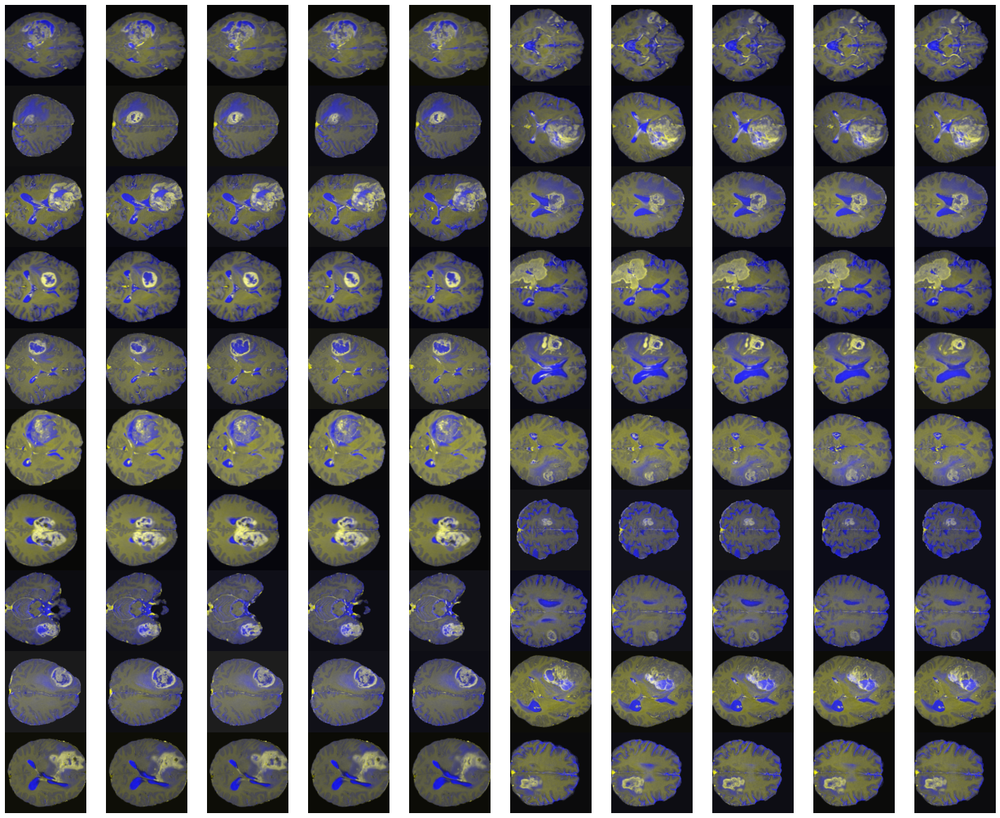

In [336]:
f, axarr = plt.subplots(10, 10, sharex=True, sharey=True, figsize=(20, 16))
for i in range(10):
    for j in range(10):
        axarr[i, j].imshow(x_test[100+10*i+j], cmap='gray') #3 channel 한 번에 띄우면 이미지가 이상해ㅜ
        axarr[i, j].axis('off')
plt.subplots_adjust(wspace=0, hspace=0, left=0, right=1, bottom=0, top=1)
plt.show()

0.0 1.0


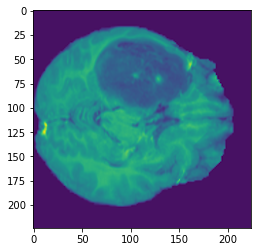

0.0 1.0


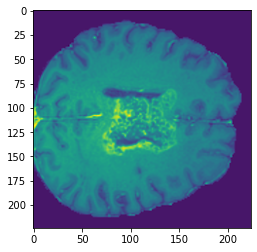

0.0 1.0


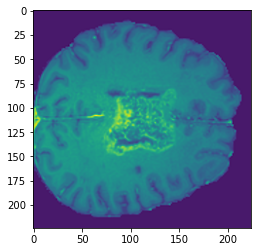

0.0 1.0


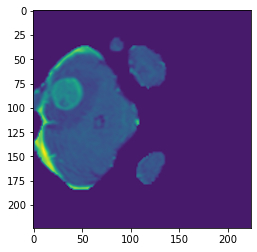

0.0 1.0


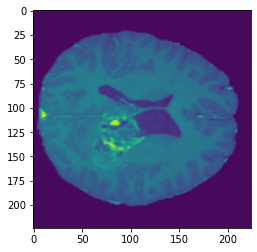

0.0 1.0


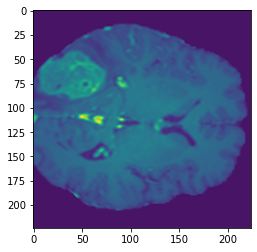

0.0 1.0


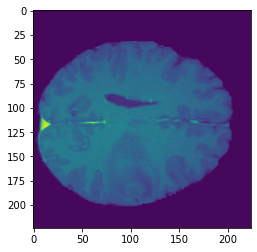

0.0 1.0


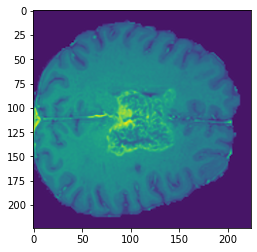

0.0 0.99999994


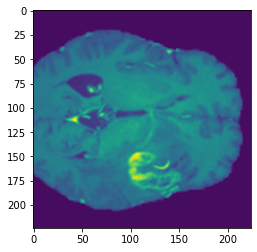

0.0 1.0


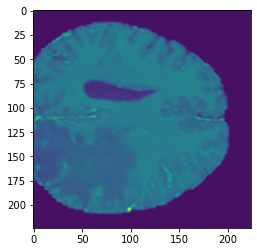

0.0 1.0


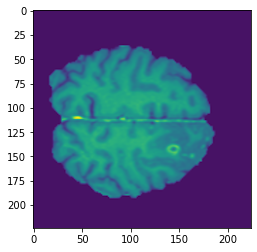

0.0 1.0


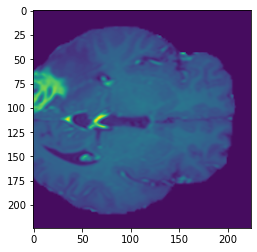

0.0 1.0


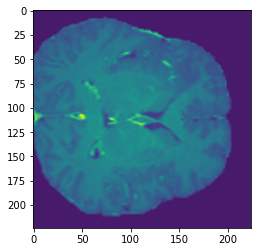

0.0 1.0


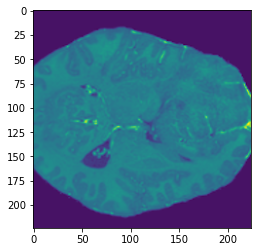

0.0 1.0


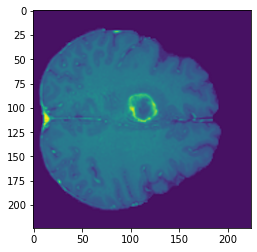

0.0 1.0


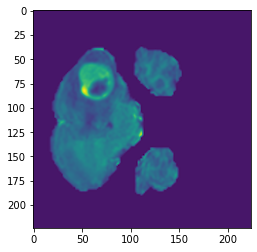

0.0 1.0


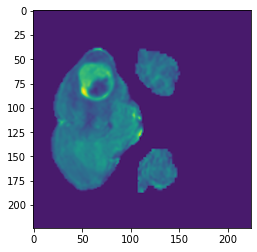

0.0 1.0


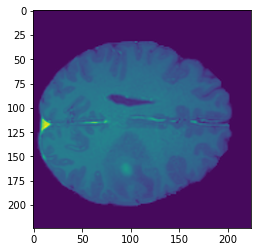

0.0 1.0


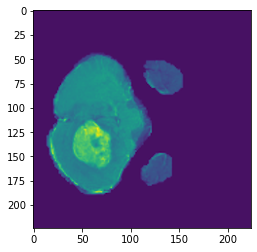

0.0 1.0


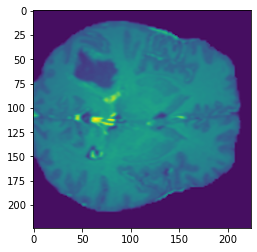

0.0 1.0


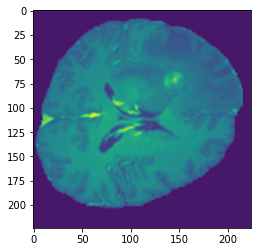

0.0 1.0


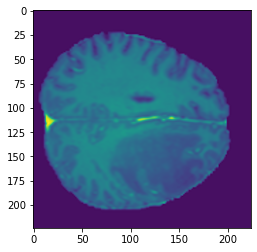

0.0 1.0


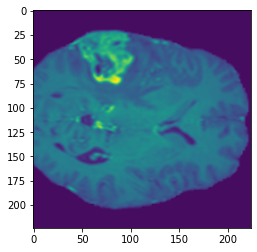

0.0 1.0000001


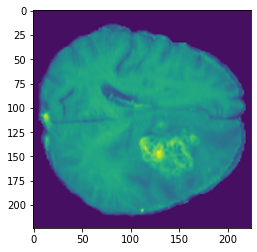

0.0 1.0


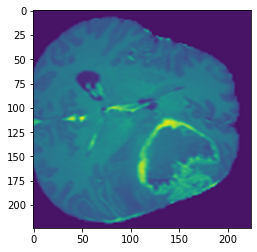

0.0 1.0


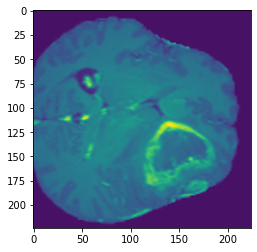

0.0 1.0


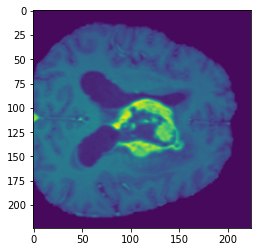

0.0 1.0


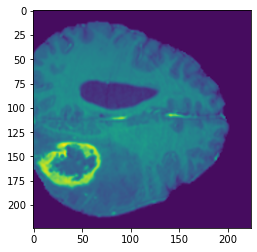

0.0 1.0


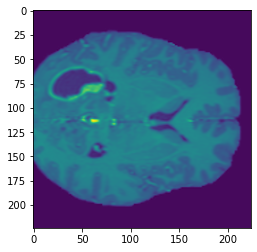

0.0 1.0000001


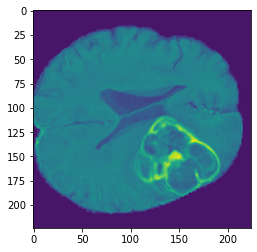

0.0 1.0


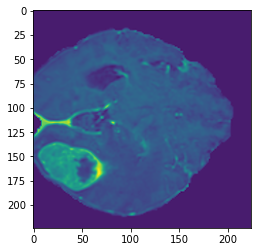

0.0 1.0


KeyboardInterrupt: 

In [334]:
for x, y in test_datagen.flow(x_valid, y_valid):
    for i in range(x.shape[0]):
        print(x[i].min(), x[i].max())
        plt.imshow(x[i][:,:,0])
        plt.show()
    break

## 4. Modeling

In [295]:
train_datagen = ImageDataGenerator(rotation_range=30, 
                                   zoom_range=[1.0, 1.30],
                                   horizontal_flip=True,
                                   vertical_flip=True, 
                                   fill_mode='constant', cval=0) #검은 상자 모양 조금 보임,,

test_datagen = ImageDataGenerator()

### Train

In [300]:
import tensorflow as tf
from tensorflow.keras.callbacks import LearningRateScheduler
from tensorflow.keras.applications.densenet import preprocess_input, DenseNet121

In [301]:
# Hyperparameters
model_num = '220210_1730_'

In [303]:
# DECREASE LEARNING RATE EACH EPOCH
annealer = LearningRateScheduler(lambda x: 1e-3 * 0.95 ** x)

#train networks
nets = 5
model = [0] *nets
single_proba=[]
ext_single_proba=[]

for j in range(nets):
    tf.keras.backend.clear_session()
    
    model_name= model_num +str(j+1)
    model_path = os.path.join('save_model', model_name + '_bestmodel.h5') #model path wrong

    checkpoint = tf.keras.callbacks.ModelCheckpoint(filepath=model_path,
                                                    monitor='val_accuracy', #monitor val_loss retry
                                                    verbose=1,
                                                    save_weights_only=False,
                                                    save_best_only=True,
                                                    mode='auto',
                                                    save_freq='epoch')
    early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=10)
    
    
    run = wandb.init(project='Brain_GBMmeta', group=model_num, 
                     config={
                         'batch_size':32, 
                         'epochs':50,
                         'memo':'monitorValAccuracy', 
                         'loss_function':'categorical_crossentropy', 
                         'architecture':'DenseNet121 pretrained', 
                         'dataset':'220210_data'
                     }, 
                    name=model_name)
    config = wandb.config
    
    
    densenet121=DenseNet121()
    
    model[j] = densenet121.layers[-2].output
    model[j] = tf.keras.layers.Dense(2, activation='softmax')(model[j])
    model[j] = tf.keras.models.Model(inputs=densenet121.input, outputs=model[j])
    
    model[j].compile(loss=config.loss_function, 
                     optimizer='adam',
                     metrics=['accuracy'])
    
    
    _ = model[j].fit(train_datagen.flow(x_train, y_train, batch_size=config.batch_size), 
                     validation_data=test_datagen.flow(x_valid, y_valid, batch_size=20),
                     epochs=config.epochs,
                     steps_per_epoch=x_train.shape[0]//32, 
                     callbacks=[annealer, checkpoint, early_stopping, WandbCallback(monitor='val_accuracy',
                                                                                    log_evaluation=True)],
                     verbose=1)

    proba = model[j].predict(x_test) #test_datagen..? > 아무 차이 없는 듯..? 확인 필요
    single_proba.append(proba)
    
    ext_proba = model[j].predict(x_ext)
    ext_single_proba.append(ext_proba)
    
    wandb.log({'int_test_proba': proba, 'ext_test_proba':ext_proba})
    
    print("CNN {0:d}: Epochs={1:d}, Train accuracy={2:.5f}, Validation accuracy={3:.5f} \n".format(
        j+1,config.epochs,max(_.history['accuracy']),max(_.history['val_accuracy']) ))
    
    wandb.join()

wandb: WARNING WandbCallback is unable to log validation data. When using a generator for validation_data, you must pass validation_steps


Epoch 1/50
56/56 [==============================] - ETA: 0s - loss: 0.6271 - accuracy: 0.7351
Epoch 00001: val_accuracy improved from -inf to 0.32500, saving model to save_model/220210_1730_1_bestmodel.h5
56/56 [==============================] - 23s 412ms/step - loss: 0.6271 - accuracy: 0.7351 - val_loss: 3.2798 - val_accuracy: 0.3250
Epoch 2/50
56/56 [==============================] - ETA: 0s - loss: 0.3991 - accuracy: 0.8225
Epoch 00002: val_accuracy improved from 0.32500 to 0.77500, saving model to save_model/220210_1730_1_bestmodel.h5
56/56 [==============================] - 19s 343ms/step - loss: 0.3991 - accuracy: 0.8225 - val_loss: 0.9931 - val_accuracy: 0.7750
Epoch 3/50
56/56 [==============================] - ETA: 0s - loss: 0.3714 - accuracy: 0.8355
Epoch 00003: val_accuracy did not improve from 0.77500
56/56 [==============================] - 18s 330ms/step - loss: 0.3714 - accuracy: 0.8355 - val_loss: 1.3829 - val_accuracy: 0.6050
Epoch 4/50
56/56 [========================

accuracy,▁▃▄▅▅▅▅▅▆▆▆▅▆▇▇▇▇▇▇▇███▇██████▇
epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▅▆▆▆▆▇▇▇▇███
loss,█▅▅▄▄▄▄▄▃▃▃▄▂▂▂▃▂▂▂▂▁▁▁▂▁▁▁▁▁▁▂
lr,██▇▇▆▆▆▅▅▅▄▄▄▄▃▃▃▃▃▂▂▂▂▂▂▂▁▁▁▁▁
val_accuracy,▁▇▅▆▄▂▆▁▇█▇▆▅█▇▆▇▇▇▃███▇▇▆██▆▆▇
val_loss,▄▂▂▂▁▂▂▄▂█▁▁▂▁▃▁▂▁▁▄▁▁▂▂▂▂▂▁▁█▄
accuracy,0.96029
best_epoch,20
best_val_accuracy,0.825
epoch,30
loss,0.10703


wandb: WARNING WandbCallback is unable to log validation data. When using a generator for validation_data, you must pass validation_steps


Epoch 1/50
56/56 [==============================] - ETA: 0s - loss: 0.5875 - accuracy: 0.7436
Epoch 00001: val_accuracy improved from -inf to 0.67500, saving model to save_model/220210_1730_2_bestmodel.h5
56/56 [==============================] - 21s 376ms/step - loss: 0.5875 - accuracy: 0.7436 - val_loss: 11.0380 - val_accuracy: 0.6750
Epoch 2/50
56/56 [==============================] - ETA: 0s - loss: 0.3806 - accuracy: 0.8213
Epoch 00002: val_accuracy did not improve from 0.67500
56/56 [==============================] - 18s 327ms/step - loss: 0.3806 - accuracy: 0.8213 - val_loss: 1.1358 - val_accuracy: 0.6600
Epoch 3/50
56/56 [==============================] - ETA: 0s - loss: 0.3036 - accuracy: 0.8633
Epoch 00003: val_accuracy improved from 0.67500 to 0.72500, saving model to save_model/220210_1730_2_bestmodel.h5
56/56 [==============================] - 19s 347ms/step - loss: 0.3036 - accuracy: 0.8633 - val_loss: 1.4095 - val_accuracy: 0.7250
Epoch 4/50
56/56 [=======================

accuracy,▁▃▅▄▅▆▅▆▆▇▇▇▇█████▇▇
epoch,▁▁▂▂▂▃▃▄▄▄▅▅▅▆▆▇▇▇██
loss,█▅▄▅▄▄▄▃▃▂▂▂▂▁▁▁▁▁▂▂
lr,█▇▇▆▆▅▅▅▄▄▃▃▃▃▂▂▂▁▁▁
val_accuracy,▅▅▆▁▅▇▅▇▅█▂▆▆▇▆███▇▇
val_loss,█▁▂▇▂▁█▁▁▁▂▁▁▁▁▂▁▁▁▁
accuracy,0.95746
best_epoch,9
best_val_accuracy,0.815
epoch,19
loss,0.12005


wandb: WARNING WandbCallback is unable to log validation data. When using a generator for validation_data, you must pass validation_steps


Epoch 1/50
56/56 [==============================] - ETA: 0s - loss: 0.5810 - accuracy: 0.7221
Epoch 00001: val_accuracy improved from -inf to 0.67500, saving model to save_model/220210_1730_3_bestmodel.h5
56/56 [==============================] - 21s 369ms/step - loss: 0.5810 - accuracy: 0.7221 - val_loss: 58.0540 - val_accuracy: 0.6750
Epoch 2/50
56/56 [==============================] - ETA: 0s - loss: 0.4404 - accuracy: 0.7992
Epoch 00002: val_accuracy did not improve from 0.67500
56/56 [==============================] - 18s 327ms/step - loss: 0.4404 - accuracy: 0.7992 - val_loss: 8.5445 - val_accuracy: 0.3250
Epoch 3/50
56/56 [==============================] - ETA: 0s - loss: 0.3661 - accuracy: 0.8406
Epoch 00003: val_accuracy improved from 0.67500 to 0.70000, saving model to save_model/220210_1730_3_bestmodel.h5
56/56 [==============================] - 20s 351ms/step - loss: 0.3661 - accuracy: 0.8406 - val_loss: 1.1791 - val_accuracy: 0.7000
Epoch 4/50
56/56 [=======================

Epoch 29/50
56/56 [==============================] - ETA: 0s - loss: 0.0344 - accuracy: 0.9898
Epoch 00029: val_accuracy did not improve from 0.83000
56/56 [==============================] - 19s 348ms/step - loss: 0.0344 - accuracy: 0.9898 - val_loss: 0.6056 - val_accuracy: 0.8100
Epoch 30/50
56/56 [==============================] - ETA: 0s - loss: 0.0178 - accuracy: 0.9966
Epoch 00030: val_accuracy did not improve from 0.83000
56/56 [==============================] - 19s 348ms/step - loss: 0.0178 - accuracy: 0.9966 - val_loss: 0.8192 - val_accuracy: 0.7850
Epoch 31/50
56/56 [==============================] - ETA: 0s - loss: 0.0280 - accuracy: 0.9938
Epoch 00031: val_accuracy did not improve from 0.83000
56/56 [==============================] - 19s 347ms/step - loss: 0.0280 - accuracy: 0.9938 - val_loss: 2.0867 - val_accuracy: 0.5700
Epoch 32/50
56/56 [==============================] - ETA: 0s - loss: 0.0177 - accuracy: 0.9938
Epoch 00032: val_accuracy did not improve from 0.83000
56/5

accuracy,▁▃▄▅▅▆▆▆▆▆▆▇▇▇▆▇▇▇▇▇▇███▇███████
epoch,▁▁▁▂▂▂▂▃▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▆▇▇▇▇███
loss,█▆▅▄▄▄▃▄▃▄▄▃▂▂▃▂▂▃▂▂▂▂▁▁▂▂▂▁▁▁▁▁
lr,██▇▇▆▆▆▅▅▅▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▂▂▁▁▁▁▁
val_accuracy,▆▁▆▇▅█▆▆▆▆▆▆▇█▆▃▇▅▅█▇█▆▇▄▇███▇▄▇
val_loss,█▂▁▁▁▁▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
accuracy,0.99376
best_epoch,21
best_val_accuracy,0.83
epoch,31
loss,0.0177


wandb: WARNING WandbCallback is unable to log validation data. When using a generator for validation_data, you must pass validation_steps


Epoch 1/50
56/56 [==============================] - ETA: 0s - loss: 0.5757 - accuracy: 0.7448
Epoch 00001: val_accuracy improved from -inf to 0.32500, saving model to save_model/220210_1730_4_bestmodel.h5
56/56 [==============================] - 22s 386ms/step - loss: 0.5757 - accuracy: 0.7448 - val_loss: 4.5430 - val_accuracy: 0.3250
Epoch 2/50
56/56 [==============================] - ETA: 0s - loss: 0.3683 - accuracy: 0.8315
Epoch 00002: val_accuracy improved from 0.32500 to 0.66000, saving model to save_model/220210_1730_4_bestmodel.h5
56/56 [==============================] - 20s 362ms/step - loss: 0.3683 - accuracy: 0.8315 - val_loss: 0.6661 - val_accuracy: 0.6600
Epoch 3/50
56/56 [==============================] - ETA: 0s - loss: 0.4104 - accuracy: 0.8077
Epoch 00003: val_accuracy improved from 0.66000 to 0.67500, saving model to save_model/220210_1730_4_bestmodel.h5
56/56 [==============================] - 20s 364ms/step - loss: 0.4104 - accuracy: 0.8077 - val_loss: 4.0729 - val_

accuracy,▁▄▃▅▅▆▆▅▆▆▆▇▆▇▇████████
epoch,▁▁▂▂▂▃▃▃▄▄▄▅▅▅▅▆▆▆▇▇▇██
loss,█▅▆▅▄▃▄▄▃▂▃▂▃▂▂▂▁▁▁▁▁▁▁
lr,█▇▇▇▆▆▅▅▅▄▄▄▃▃▃▂▂▂▂▂▁▁▁
val_accuracy,▁▅▆▇▆▅▄▆▅▅▅▇█▅▇█▇█▇▇▇▆▇
val_loss,█▁▇▁▂▂▂▂▂▁▃▂▁▁▁▁▁▂▁▂▁▂▃
accuracy,0.97731
best_epoch,12
best_val_accuracy,0.85
epoch,22
loss,0.0672


wandb: WARNING WandbCallback is unable to log validation data. When using a generator for validation_data, you must pass validation_steps


Epoch 1/50
56/56 [==============================] - ETA: 0s - loss: 0.5426 - accuracy: 0.7408
Epoch 00001: val_accuracy improved from -inf to 0.34000, saving model to save_model/220210_1730_5_bestmodel.h5
56/56 [==============================] - 22s 385ms/step - loss: 0.5426 - accuracy: 0.7408 - val_loss: 1.3303 - val_accuracy: 0.3400
Epoch 2/50
56/56 [==============================] - ETA: 0s - loss: 0.3893 - accuracy: 0.8310
Epoch 00002: val_accuracy improved from 0.34000 to 0.54000, saving model to save_model/220210_1730_5_bestmodel.h5
56/56 [==============================] - 20s 366ms/step - loss: 0.3893 - accuracy: 0.8310 - val_loss: 1.8433 - val_accuracy: 0.5400
Epoch 3/50
56/56 [==============================] - ETA: 0s - loss: 0.3978 - accuracy: 0.8196
Epoch 00003: val_accuracy improved from 0.54000 to 0.62000, saving model to save_model/220210_1730_5_bestmodel.h5
56/56 [==============================] - 20s 363ms/step - loss: 0.3978 - accuracy: 0.8196 - val_loss: 2.1328 - val_

accuracy,▁▃▃▄▅▅▄▅▆▆▆▇▇▇▇▇▆▆▇▇▇█▇▇█▇█▇█████
epoch,▁▁▁▂▂▂▂▃▃▃▃▃▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇███
loss,█▆▆▅▄▄▅▄▄▃▃▃▃▂▂▂▄▃▃▂▂▂▂▂▁▂▁▂▁▁▁▁▂
lr,██▇▇▆▆▆▅▅▅▅▄▄▄▄▃▃▃▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁
val_accuracy,▁▄▅▆▇▇▆▇▇▅▇▇▆▇▇▇▇▃▇▇▆███▇▅▆▇▇▇█▇▇
val_loss,▄▆▇▁▂▂▂▂▃▂▂▁▂▂▂▂▂█▁▂▂▂▂▂▂▄▂▂▃▂▂▄▃
accuracy,0.97731
best_epoch,22
best_val_accuracy,0.865
epoch,32
loss,0.0618


In [321]:
model

In [322]:
model[0].save("/home/ubuntu/SJEOM/Brain-GBMmeta/save_model/220210_1730_1_bestmodel.h5")
model[1].save("/home/ubuntu/SJEOM/Brain-GBMmeta/save_model/220210_1730_2_bestmodel.h5")
model[2].save("/home/ubuntu/SJEOM/Brain-GBMmeta/save_model/220210_1730_3_bestmodel.h5")
model[3].save("/home/ubuntu/SJEOM/Brain-GBMmeta/save_model/220210_1730_4_bestmodel.h5")
model[4].save("/home/ubuntu/SJEOM/Brain-GBMmeta/save_model/220210_1730_5_bestmodel.h5")

In [24]:
nets = 5
model = [0]*5
model[0] = keras.models.load_model("save_model/220111_1240_1_bestmodel.h5")
model[1] = keras.models.load_model("save_model/220111_1240_2_bestmodel.h5")
model[2] = keras.models.load_model("save_model/220111_1240_3_bestmodel.h5")
model[3] = keras.models.load_model("save_model/220111_1240_4_bestmodel.h5")
model[4] = keras.models.load_model("save_model/220111_1240_5_bestmodel.h5")

[2022-02-08 08:05:25.067 ip-10-0-1-67:9588 INFO utils.py:27] RULE_JOB_STOP_SIGNAL_FILENAME: None
[2022-02-08 08:05:25.130 ip-10-0-1-67:9588 INFO profiler_config_parser.py:111] Unable to find config at /opt/ml/input/config/profilerconfig.json. Profiler is disabled.


## 5. Test

In [308]:
from sklearn.metrics import confusion_matrix, roc_auc_score, recall_score, f1_score, balanced_accuracy_score, classification_report, roc_curve, precision_score

In [309]:
def plot_roc(fpr, tpr):
    plt.plot(fpr, tpr)
    plt.axis([0, 1, 0, 1])
    plt.xlabel('False positive rate')
    plt.ylabel('True positive rate')
    plt.title('Receiver operating characteristic')
    plt.plot([0, 1], [0, 1], 'k--', label="random guess")
    plt.show()

In [310]:
def matrix(y_true, y_pred, y_proba):
    conf_mat = confusion_matrix(y_true.argmax(axis=1), y_pred.argmax(axis=1))
    TP = conf_mat[1][1]
    TN = conf_mat[0][0]
    FN = conf_mat[1][0]
    FP = conf_mat[0][1]

    acc = round((TP+TN)/(TP+TN+FP+FN), 4)
    sens = round(TP/(TP+FN), 4)
    spec = round(TN/(TN+FP), 4)
    auroc = round(roc_auc_score(y_true, y_proba), 4)
    precision = round(precision_score(y_true.argmax(axis=1), y_pred.argmax(axis=1)), 4)
    recall = round(recall_score(y_true.argmax(axis=1), y_pred.argmax(axis=1)), 4)
    f1score = round(f1_score(y_true.argmax(axis=1), y_pred.argmax(axis=1)), 4)
    w_acc = round(balanced_accuracy_score(y_true.argmax(axis=1), y_pred.argmax(axis=1)), 4)

    print(conf_mat, "\n")
    print("Acc", acc)
    print("Sensitivity", sens)
    print("Specificity", spec)
    print("AUROC", auroc)
    print('Precision', precision)
    print("Recall", recall)
    print("F1",  f1score)
    print("Weighted accuracy", w_acc, "\n")
    print(classification_report(y_true, y_pred))


    fpr, tpr, thresholds = roc_curve(y_true.argmax(axis=1), y_pred.argmax(axis=1))

    plt.figure(figsize=(6,6))
    plot_roc(fpr, tpr)
    roc_auc_score(y_true, y_proba)

In [325]:
with open('220210_1730_single_proba.pickle', 'wb') as f:
    pickle.dump(single_proba, f)

with open('220210_1730_ext_single_proba.pickle', 'wb') as f:
    pickle.dump(ext_single_proba, f)

In [365]:
for x in test_datagen.flow(x_test):
    print(x.min(), x.max())

0.0 1.0000001
0.0 1.0000001
0.0 1.0000001
0.0 1.0000001
0.0 1.0000001
0.0 1.0000001
0.0 1.0000001
0.0 1.0000001
0.0 1.0000001
0.0 1.0000001
0.0 1.0000001
0.0 1.0000001
0.0 1.0000001
0.0 1.0000001
0.0 1.0000001
0.0 1.0000001
0.0 1.0000001
0.0 1.0000001
0.0 1.0000001
0.0 1.0000001
0.0 1.0000001
0.0 1.0000001
0.0 1.0000001
0.0 1.0000001
0.0 1.0000001
0.0 1.0000001
0.0 1.0000001
0.0 1.0000001
0.0 1.0000001
0.0 1.0000001
0.0 1.0000001
0.0 1.0000001
0.0 1.0000001
0.0 1.0000001
0.0 1.0000001
0.0 1.0000001
0.0 1.0000001
0.0 1.0000001
0.0 1.0000001
0.0 1.0000001
0.0 1.0000001
0.0 1.0000001
0.0 1.0000001
0.0 1.0000001
0.0 1.0000001
0.0 1.0000001
0.0 1.0000001
0.0 1.0000001
0.0 1.0000001
0.0 1.0000001
0.0 1.0000001
0.0 1.0000001
0.0 1.0000001
0.0 1.0000001
0.0 1.0000001
0.0 1.0000001
0.0 1.0000001
0.0 1.0000001
0.0 1.0000001
0.0 1.0000001
0.0 1.0000001
0.0 1.0000001
0.0 1.0000001
0.0 1.0000001
0.0 1.0
0.0 1.0000001
0.0 1.0000001
0.0 1.0000001
0.0 1.0000001
0.0 1.0000001
0.0 1.0000001
0.0 1.000000

KeyboardInterrupt: 

### Internal Test

In [400]:
# Single
single_proba_= []
for m in model:
    proba = m.predict(test_datagen.flow(x_test, shuffle=False))
    single_proba_.append(proba)
    
single_pred_ = []
for s in single_proba_:
    proba = (s > 0.5).astype(np.int64)
    single_pred_.append(proba)
    

# Ensemble
results_ = np.zeros( (x_test.shape[0],2) )
for s in single_proba_:
    results_ = results_ + s

y_proba_ = results_/5
y_pred_ = (y_proba_ > 0.5).astype(np.int64)

[[178  22]
 [ 54 146]] 

Acc 0.81
Sensitivity 0.73
Specificity 0.89
AUROC 0.8995
Precision 0.869
Recall 0.73
F1 0.7935
Weighted accuracy 0.81 

              precision    recall  f1-score   support

           0       0.77      0.89      0.82       200
           1       0.87      0.73      0.79       200

   micro avg       0.81      0.81      0.81       400
   macro avg       0.82      0.81      0.81       400
weighted avg       0.82      0.81      0.81       400
 samples avg       0.81      0.81      0.81       400



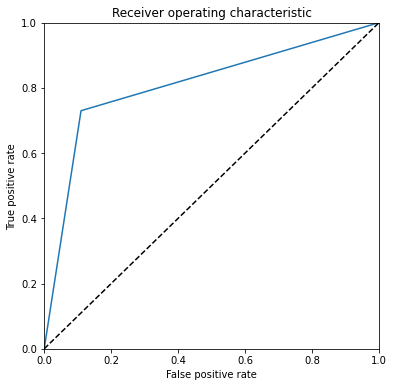

In [401]:
matrix(y_test, y_pred_, y_proba_)

In [326]:
# Single
single_proba= []
for m in model:
    proba = m.predict(x_test)
    single_proba.append(proba)
    
single_pred = []
for s in single_proba:
    proba = (s > 0.5).astype(np.int64)
    single_pred.append(proba)
    

# Ensemble
results = np.zeros( (x_test.shape[0],2) )
for s in single_proba:
    results = results + s

y_proba = results/5
y_pred = (y_proba > 0.5).astype(np.int64)

[[178  22]
 [ 54 146]] 

Acc 0.81
Sensitivity 0.73
Specificity 0.89
AUROC 0.8995
Precision 0.869
Recall 0.73
F1 0.7935
Weighted accuracy 0.81 

              precision    recall  f1-score   support

           0       0.77      0.89      0.82       200
           1       0.87      0.73      0.79       200

   micro avg       0.81      0.81      0.81       400
   macro avg       0.82      0.81      0.81       400
weighted avg       0.82      0.81      0.81       400
 samples avg       0.81      0.81      0.81       400



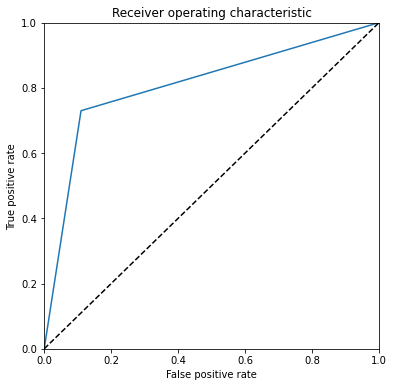

In [339]:
#220210_1730
# Esemble Result
matrix(y_test, y_pred, y_proba)

In [344]:
n=4

[[172  28]
 [ 38 162]] 

Acc 0.835
Sensitivity 0.81
Specificity 0.86
AUROC 0.9144
Precision 0.8526
Recall 0.81
F1 0.8308
Weighted accuracy 0.835 

              precision    recall  f1-score   support

           0       0.82      0.86      0.84       200
           1       0.85      0.81      0.83       200

   micro avg       0.83      0.83      0.83       400
   macro avg       0.84      0.83      0.83       400
weighted avg       0.84      0.83      0.83       400
 samples avg       0.83      0.83      0.83       400



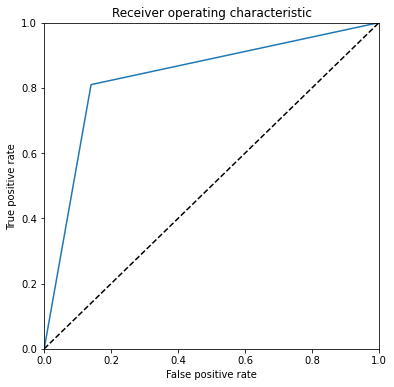

In [345]:
#220210_1730
matrix(y_test, single_pred[n], single_proba[n])

### External Test

In [314]:
# Single
ext_single_proba= []
for m in model:
    proba = m.predict(x_ext)
    ext_single_proba.append(proba)
    
ext_single_pred = []
for s in ext_single_proba:
    proba = (s > 0.5).astype(np.int64)
    ext_single_pred.append(proba)
    
# Ensemble
ext_results = np.zeros( (x_ext.shape[0],2) )
for s in ext_single_proba:
    ext_results = ext_results + s

ext_y_proba = ext_results/5
ext_y_pred = (ext_y_proba > 0.5).astype(np.int64)

[[418  87]
 [ 61 149]] 

Acc 0.793
Sensitivity 0.7095
Specificity 0.8277
AUROC 0.8363
Precision 0.6314
Recall 0.7095
F1 0.6682
Weighted accuracy 0.7686 

              precision    recall  f1-score   support

           0       0.87      0.83      0.85       505
           1       0.63      0.71      0.67       210

   micro avg       0.79      0.79      0.79       715
   macro avg       0.75      0.77      0.76       715
weighted avg       0.80      0.79      0.80       715
 samples avg       0.79      0.79      0.79       715



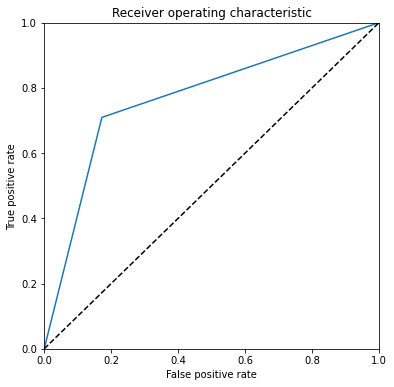

In [346]:
#220210_1730
matrix(y_ext, ext_y_pred, ext_y_proba)

In [316]:
n=4

[[384 121]
 [ 57 153]] 

Acc 0.751
Sensitivity 0.7286
Specificity 0.7604
AUROC 0.8203
Precision 0.5584
Recall 0.7286
F1 0.6322
Weighted accuracy 0.7445 

              precision    recall  f1-score   support

           0       0.87      0.76      0.81       505
           1       0.56      0.73      0.63       210

   micro avg       0.75      0.75      0.75       715
   macro avg       0.71      0.74      0.72       715
weighted avg       0.78      0.75      0.76       715
 samples avg       0.75      0.75      0.75       715



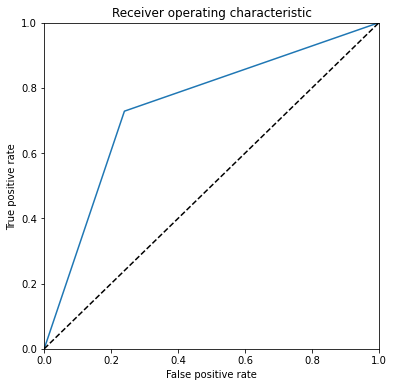

In [347]:
#220210_1730
matrix(y_ext, ext_single_pred[n], ext_single_proba[n])

#### Uncertainty - Entropy

In [355]:
int_en_entropy_list = []
for i in range(len(y_proba)):
    pq = y_proba[i] * y_ext[i] #정답에 대한 예측 확률 사용하는거 맞는지 확인
    index = np.argmax(pq)
    p = pq[index]
    entropy = -p*math.log(p) - (1-p)*math.log(1-p+ 0.00000000001)
    int_en_entropy_list.append(entropy)

In [356]:
int_sing_entropy_list = []
for i in range(len(single_proba[n])):
    pq = single_proba[n][i] * y_ext[i] #정답에 대한 예측 확률 사용하는거 맞는지 확인
    index = np.argmax(pq)
    p = pq[index]
    entropy = -p*math.log(p) - (1-p)*math.log(1-p+ 0.00000000001)
    int_sing_entropy_list.append(entropy)

In [350]:
ext_en_entropy_list = []
for i in range(len(ext_y_proba)):
    pq = ext_y_proba[i] * y_ext[i] #정답에 대한 예측 확률 사용하는거 맞는지 확인
    index = np.argmax(pq)
    p = pq[index]
    entropy = -p*math.log(p) - (1-p)*math.log(1-p+ 0.00000000001)
    ext_en_entropy_list.append(entropy)

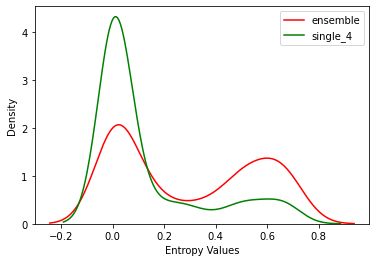

In [357]:
sns.kdeplot(int_en_entropy_list, label='ensemble', color='r')
sns.kdeplot(int_sing_entropy_list, label='single_4', color='g')
plt.xlabel('Entropy Values')
plt.legend()
plt.show()

In [351]:
ext_sing_entropy_list = []
for i in range(len(ext_single_proba[n])):
    pq = ext_single_proba[n][i] * y_ext[i]
    index = np.argmax(pq)
    p = pq[index]
    entropy = -p*math.log(p) - (1-p)*math.log(1-p+ 0.00000000001)
    ext_sing_entropy_list.append(entropy)

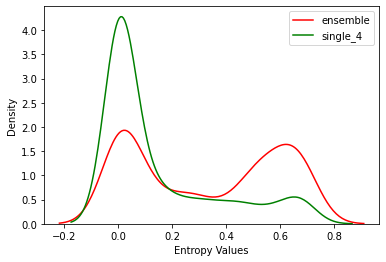

In [354]:
sns.kdeplot(ext_en_entropy_list, label='ensemble', color='r')
sns.kdeplot(ext_sing_entropy_list, label='single_4', color='g')
plt.xlabel('Entropy Values')
plt.legend()
plt.show()

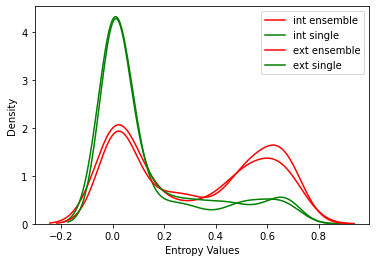

In [358]:
import seaborn as sns
sns.kdeplot(int_en_entropy_list, label='int ensemble', color='r')
sns.kdeplot(int_sing_entropy_list, label='int single', color='g')
sns.kdeplot(ext_en_entropy_list, label='ext ensemble', color='r')
sns.kdeplot(ext_sing_entropy_list, label='ext single', color='g')
plt.xlabel('Entropy Values')
plt.legend()
plt.show()

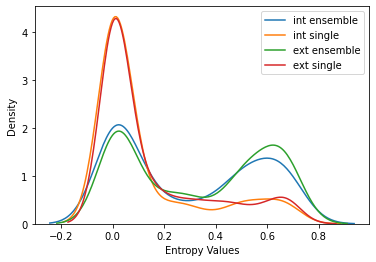

In [359]:
import seaborn as sns
sns.kdeplot(int_en_entropy_list, label='int ensemble')
sns.kdeplot(int_sing_entropy_list, label='int single')
sns.kdeplot(ext_en_entropy_list, label='ext ensemble')
sns.kdeplot(ext_sing_entropy_list, label='ext single')
plt.xlabel('Entropy Values')
plt.legend()
plt.show()

#### Uncertainty 분류 > AUROC 체크
Uncertainty cutoff 따라 high/low group 나누고 그룹별 AUROC와 gradCAM 체크  > cutoff 0.25  
High group > 낮은 AUROC, 안 좋은 gradCAM 보이는게 좋음  
* 이건 ensemble 모델만 진행하겠음

In [366]:
# Uncertainty 따라 분류할 index 추출
def uc_grouping(entropy_list, cutoff):
    high_idx = []
    low_idx = []
    for idx, entropy in enumerate(entropy_list):
        if entropy >= cutoff:
            high_idx.append(idx)
        else:
            low_idx.append(idx)
            
    return high_idx, low_idx

In [370]:
int_high, int_low = uc_grouping(int_en_entropy_list, cutoff=0.25)

In [371]:
print("Internal Uncertainty High: %.2f%%" % (len(int_high) / len(int_en_entropy_list) * 100.0))
print("Internal Uncertainty Low: %.2f%%" % (len(int_low) / len(int_en_entropy_list) * 100.0))

Internal Uncertainty High: 49.25%
Internal Uncertainty Low: 50.75%


In [378]:
# Matrix 위해 ensemble 결과 필요
y_test_high = y_test[int_high]
y_pred_high = y_pred[int_high]
y_proba_high = y_proba[int_high]

y_test_low = y_test[int_low]
y_pred_low = y_pred[int_low]
y_proba_low = y_proba[int_low]

[[53 16]
 [44 84]] 

Acc 0.6954
Sensitivity 0.6562
Specificity 0.7681
AUROC 0.7677
Precision 0.84
Recall 0.6562
F1 0.7368
Weighted accuracy 0.7122 

              precision    recall  f1-score   support

           0       0.55      0.77      0.64        69
           1       0.84      0.66      0.74       128

   micro avg       0.70      0.70      0.70       197
   macro avg       0.69      0.71      0.69       197
weighted avg       0.74      0.70      0.70       197
 samples avg       0.70      0.70      0.70       197



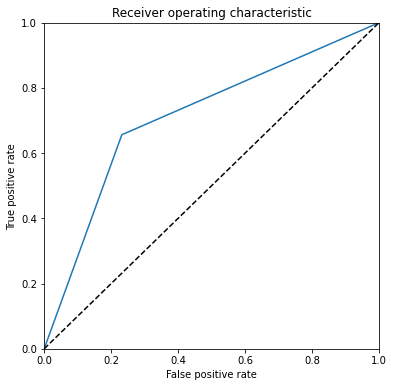

[[125   6]
 [ 10  62]] 

Acc 0.9212
Sensitivity 0.8611
Specificity 0.9542
AUROC 0.9459
Precision 0.9118
Recall 0.8611
F1 0.8857
Weighted accuracy 0.9077 

              precision    recall  f1-score   support

           0       0.93      0.95      0.94       131
           1       0.91      0.86      0.89        72

   micro avg       0.92      0.92      0.92       203
   macro avg       0.92      0.91      0.91       203
weighted avg       0.92      0.92      0.92       203
 samples avg       0.92      0.92      0.92       203



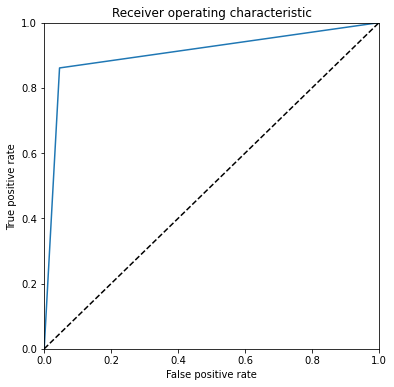

In [379]:
#cutoff 0.25
matrix(y_test_high, y_pred_high, y_proba_high)
matrix(y_test_low, y_pred_low, y_proba_low)

In [377]:
all_gradcam = []
for md in model:
    gradcam = gradcam_list(x_test, md, alpha=0.8)
    all_gradcam.append(gradcam)

In [380]:
with open('/home/ubuntu/dryou_mount/SJEOM/Brain-GBMmeta/data_five_1d/220210_data/all_gradcam.pickle', 'wb') as f:
    pickle.dump(all_gradcam, f)

In [381]:
all_gradcam_high=[]
for cam in all_gradcam:
    wow = []
    for i in int_high:
        wow.append(cam[i])
    all_gradcam_high.append(wow)

In [382]:
all_gradcam_low=[]
for cam in all_gradcam:
    wow = []
    for i in int_low:
        wow.append(cam[i])
    all_gradcam_low.append(wow)

In [383]:
single_pred_high = []
for s in single_pred:
    sp = s[int_high]
    single_pred_high.append(sp)
    
single_pred_low = []
for s in single_pred:
    sp = s[int_low]
    single_pred_low.append(sp)

In [402]:
def ensemble_gradcam_plot(gradcam_list, Y_P, Y_T, n=5, m=0, figsize=(20,16)):
    Y_T = np.argmax(Y_T, axis=1)
    
    f, axarr = plt.subplots(n, n, sharex=True, sharey=True, figsize=figsize)
    for i in range(n):
        for j in range(n):
            Y_P_ = np.argmax(Y_P[j], axis=1)
            
            idx = 25*m + 5*i
            axarr[i, j].imshow(gradcam_list[j][idx])
            axarr[i, j].axis('off')
            if Y_P_[idx] == 0:
                y_p = 'GBM'
            else:
                y_p = 'meta'

            if Y_T[idx] == 0:
                y_t = 'GBM'
            else: 
                y_t = 'meta'
                
            title = 'Pred=' + y_p + ' / True=' + y_t
            axarr[i, j].set_title(title)
    #plt.subplots_adjust(wspace=0, hspace=0, left=0, right=1, bottom=0, top=1)
    plt.show()

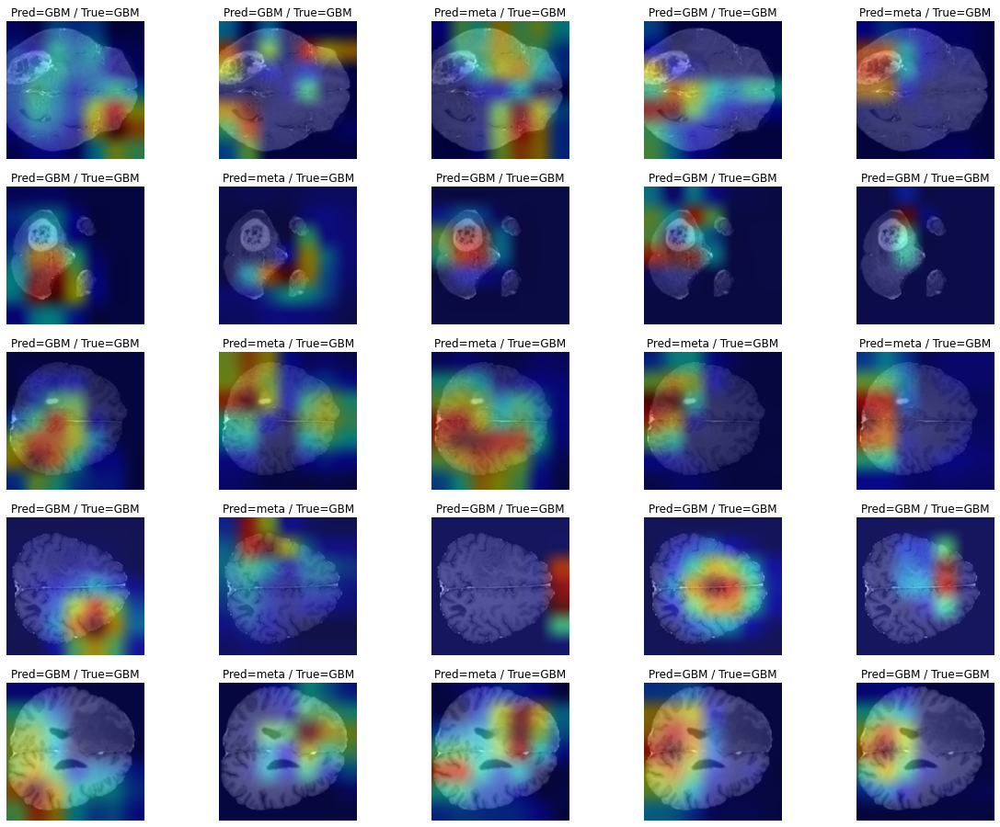

In [403]:
ensemble_gradcam_plot(all_gradcam_high, single_pred_high, y_test_high)

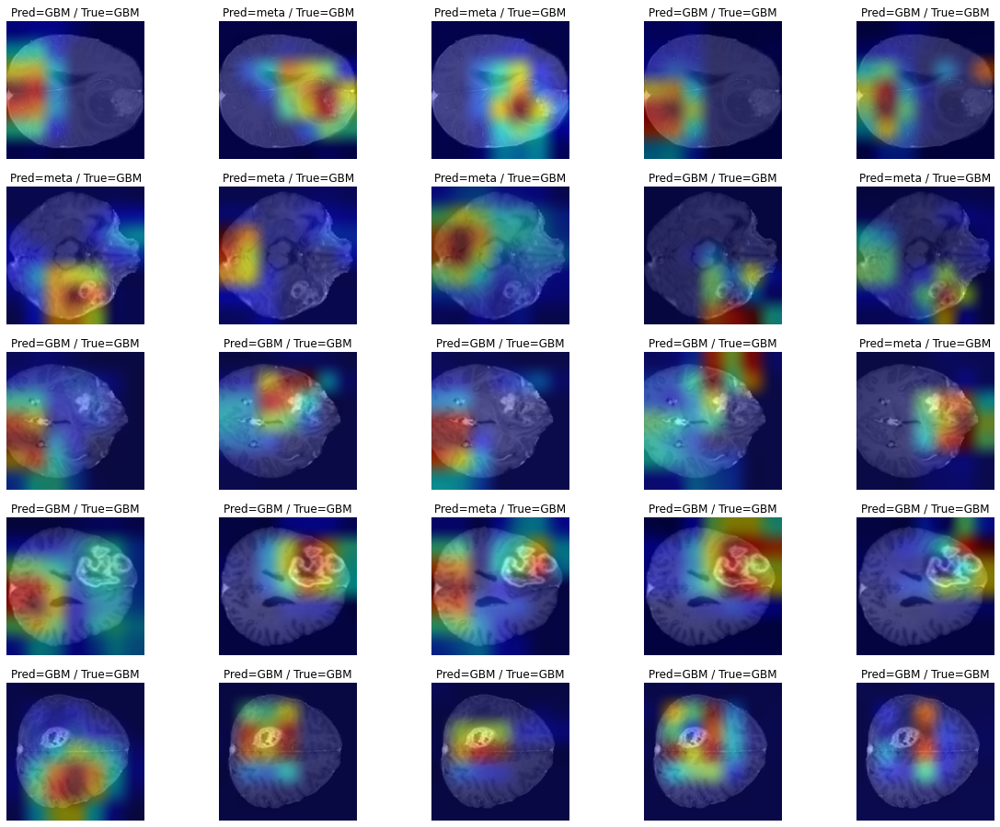

In [405]:
ensemble_gradcam_plot(all_gradcam_high, single_pred_high, y_test_high, m=1)

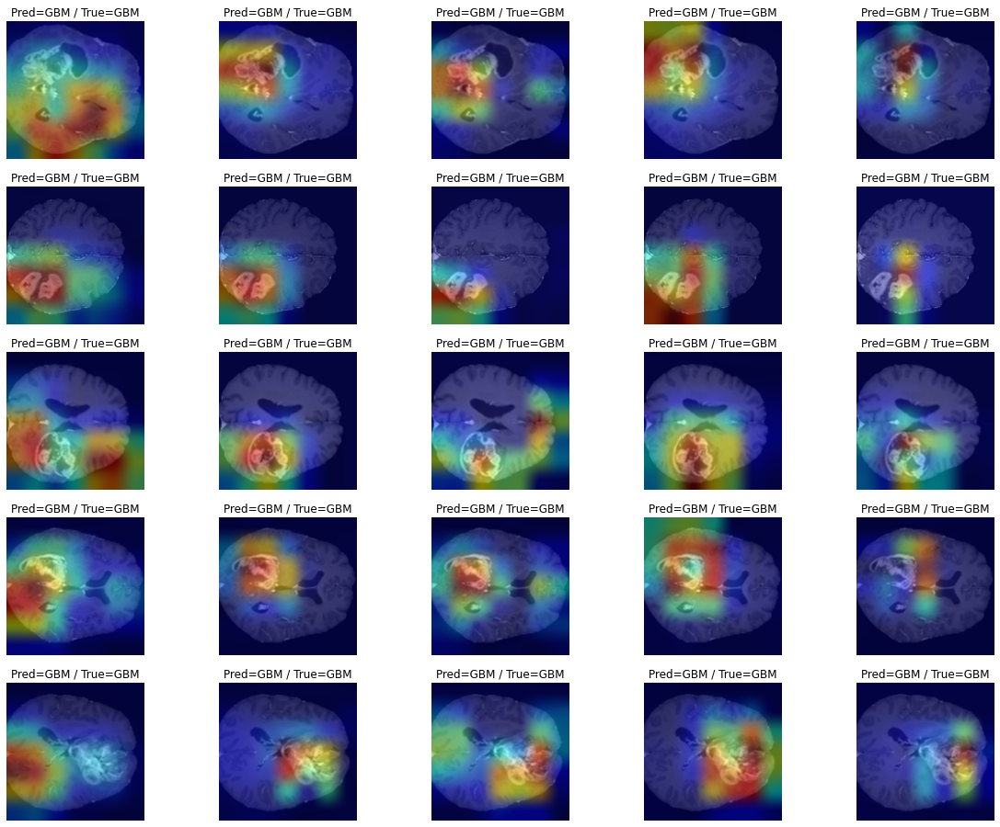

In [404]:
ensemble_gradcam_plot(all_gradcam_low, single_pred_low, y_test_low)

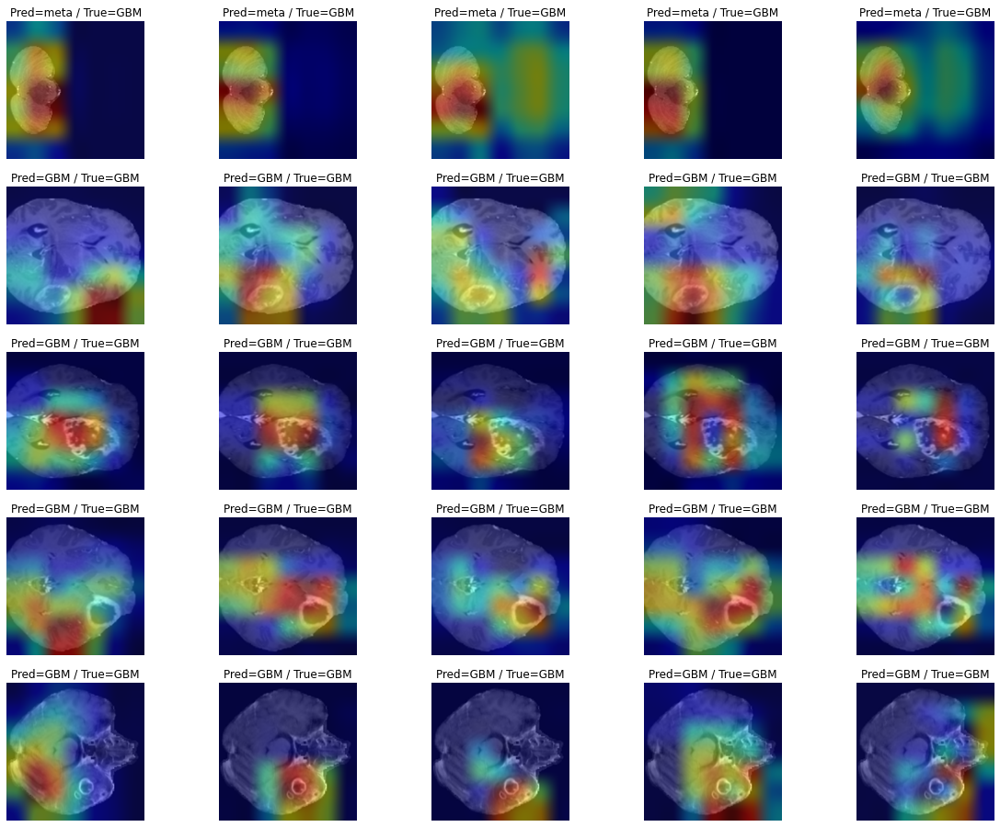

In [406]:
ensemble_gradcam_plot(all_gradcam_low, single_pred_low, y_test_low, m=1)

In [387]:
ext_high, ext_low = uc_grouping(ext_en_entropy_list, cutoff=0.25)

In [388]:
print("External Uncertainty High: %.2f%%" % (len(ext_high) / len(ext_en_entropy_list) * 100.0))
print("External Uncertainty Low: %.2f%%" % (len(ext_low) / len(ext_en_entropy_list) * 100.0))

External Uncertainty High: 55.66%
External Uncertainty Low: 44.34%


In [389]:
np.mean(np.array(ext_en_entropy_list))

0.32817446513369697

In [390]:
# Matrix 위해 ensemble 결과 필요
y_ext_high = y_ext[ext_high]
ext_y_pred_high = ext_y_pred[ext_high]
ext_y_proba_high = ext_y_proba[ext_high]

y_ext_low = y_ext[ext_low]
ext_y_pred_low = ext_y_pred[ext_low]
ext_y_proba_low = ext_y_proba[ext_low]

[[162  82]
 [ 41 113]] 

Acc 0.691
Sensitivity 0.7338
Specificity 0.6639
AUROC 0.7373
Precision 0.5795
Recall 0.7338
F1 0.6476
Weighted accuracy 0.6989 

              precision    recall  f1-score   support

           0       0.80      0.66      0.72       244
           1       0.58      0.73      0.65       154

   micro avg       0.69      0.69      0.69       398
   macro avg       0.69      0.70      0.69       398
weighted avg       0.71      0.69      0.69       398
 samples avg       0.69      0.69      0.69       398



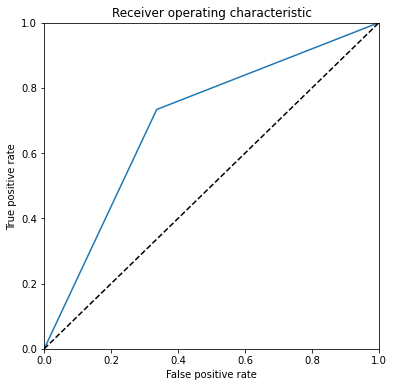

[[256   5]
 [ 20  36]] 

Acc 0.9211
Sensitivity 0.6429
Specificity 0.9808
AUROC 0.8742
Precision 0.878
Recall 0.6429
F1 0.7423
Weighted accuracy 0.8119 

              precision    recall  f1-score   support

           0       0.93      0.98      0.95       261
           1       0.88      0.64      0.74        56

   micro avg       0.92      0.92      0.92       317
   macro avg       0.90      0.81      0.85       317
weighted avg       0.92      0.92      0.92       317
 samples avg       0.92      0.92      0.92       317



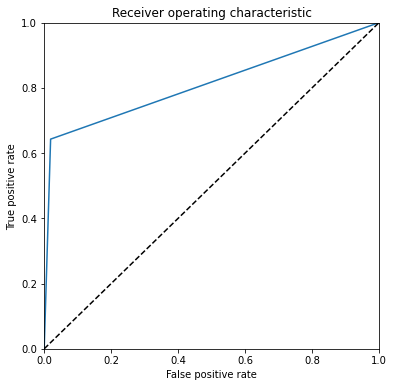

In [391]:
#cutoff = 0.25
matrix(y_ext_high, ext_y_pred_high, ext_y_proba_high)
matrix(y_ext_low, ext_y_pred_low, ext_y_proba_low)

In [392]:
ext_all_gradcam = []
for md in model:
    gradcam = gradcam_list(x_ext, md, alpha=0.8)
    ext_all_gradcam.append(gradcam)

In [393]:
with open('/home/ubuntu/dryou_mount/SJEOM/Brain-GBMmeta/data_five_1d/220210_data/ext_all_gradcam.pickle', 'wb') as f:
    pickle.dump(ext_all_gradcam, f)

In [394]:
ext_all_gradcam_high=[]
for cam in ext_all_gradcam:
    wow = []
    for i in ext_high:
        wow.append(cam[i])
    ext_all_gradcam_high.append(wow)
    
ext_all_gradcam_low=[]
for cam in ext_all_gradcam:
    wow = []
    for i in ext_low:
        wow.append(cam[i])
    ext_all_gradcam_low.append(wow)

In [395]:
ext_single_pred_high = []
for s in ext_single_pred:
    sp = s[ext_high]
    ext_single_pred_high.append(sp)
    
ext_single_pred_low = []
for s in ext_single_pred:
    sp = s[ext_low]
    ext_single_pred_low.append(sp)

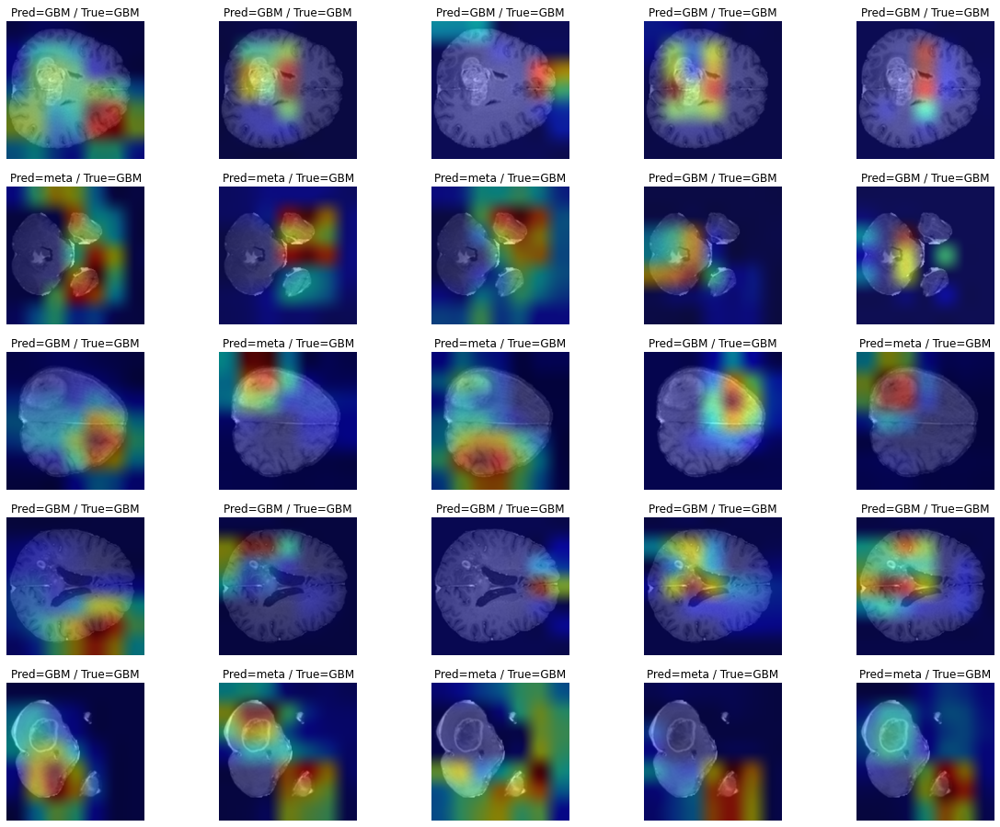

In [407]:
ensemble_gradcam_plot(ext_all_gradcam_high, ext_single_pred_high, y_ext_high)

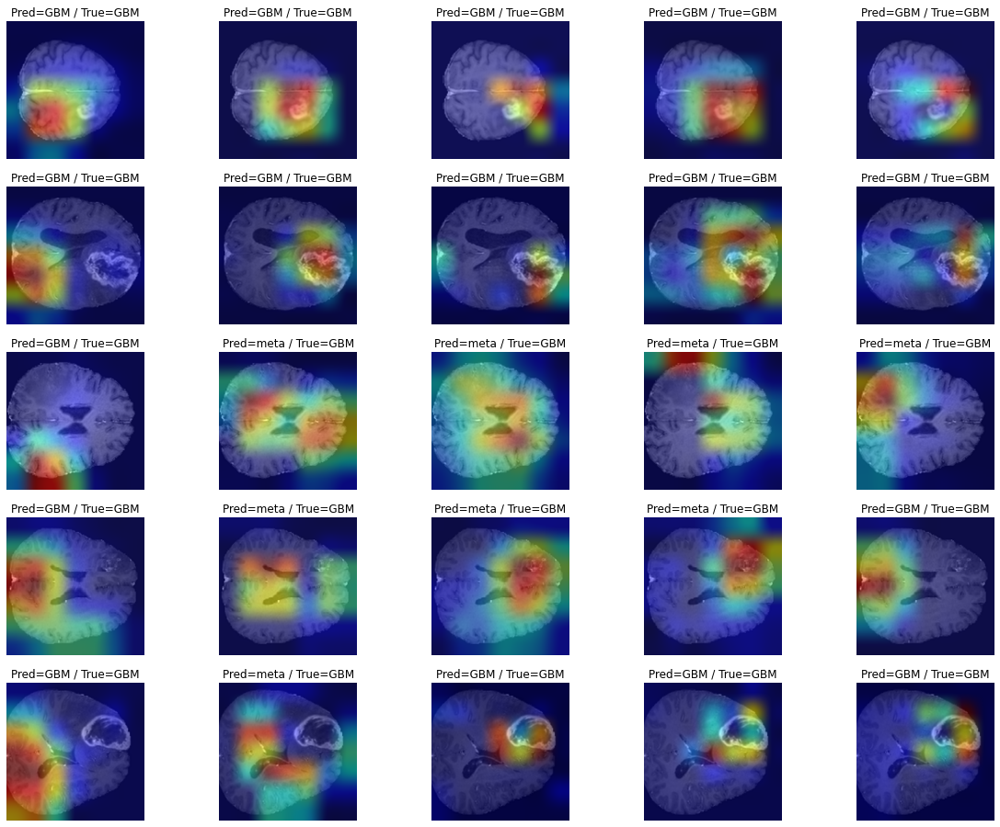

In [408]:
ensemble_gradcam_plot(ext_all_gradcam_high, ext_single_pred_high, y_ext_high, m=1)

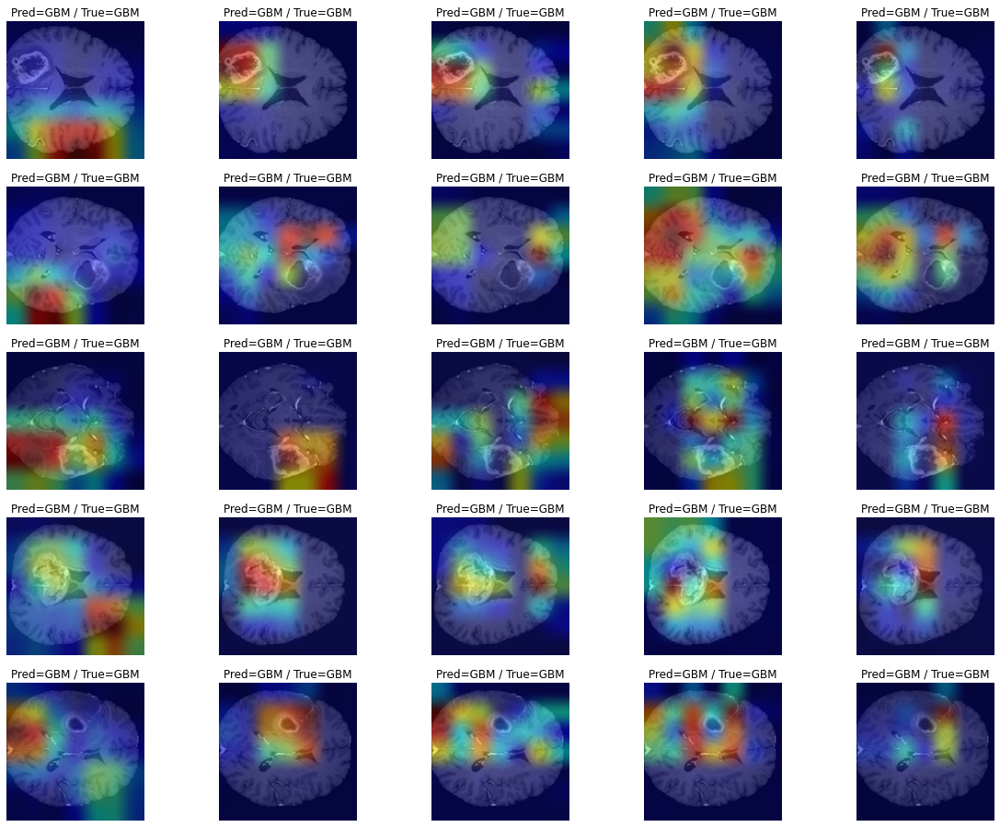

In [410]:
ensemble_gradcam_plot(ext_all_gradcam_low, ext_single_pred_low, y_ext_low, m=0)

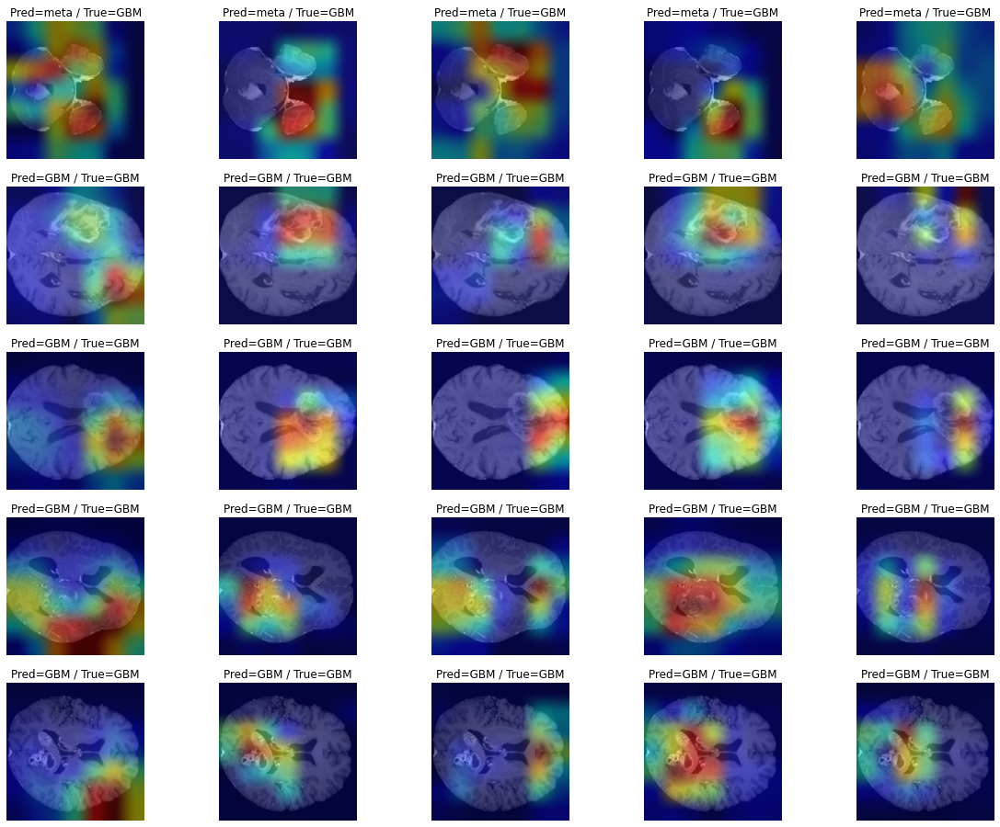

In [411]:
ensemble_gradcam_plot(ext_all_gradcam_low, ext_single_pred_low, y_ext_low, m=1)

## Grad-CAM

In [42]:
x_ext_gradcam, y_ext_prediction = gradcam_list(x_ext, model[0], alpha=0.8)

In [374]:
import matplotlib.cm as cm

def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    # First, we create a model that maps the input image to the activations
    # of the last conv layer as well as the output predictions
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(last_conv_layer_name).output, model.output]
    )

    # Then, we compute the gradient of the top predicted class for our input image
    # with respect to the activations of the last conv layer
    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]

    # This is the gradient of the output neuron (top predicted or chosen)
    # with regard to the output feature map of the last conv layer
    grads = tape.gradient(class_channel, last_conv_layer_output)

    # This is a vector where each entry is the mean intensity of the gradient
    # over a specific feature map channel
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # We multiply each channel in the feature map array
    # by "how important this channel is" with regard to the top predicted class
    # then sum all the channels to obtain the heatmap class activation
    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    # For visualization purpose, we will also normalize the heatmap between 0 & 1
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

In [375]:
def save_and_display_gradcam(img_path, heatmap, alpha=0.5):
    # Load the original image
    img = Image.fromarray(img_path[:,:,0].astype(np.float32) * 255).convert('RGB')  #보여줄 layer 설정 잊지 말기!!!!
    img = np.array(img)
    
    # Rescale heatmap to a range 0-255
    heatmap = np.uint8(255 * heatmap)

    # Use jet colormap to colorize heatmap
    jet = cm.get_cmap("jet")

    # Use RGB values of the colormap
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]

    # Create an image with RGB colorized heatmap
    jet_heatmap = keras.preprocessing.image.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
    jet_heatmap = keras.preprocessing.image.img_to_array(jet_heatmap)

    # Superimpose the heatmap on original image
    superimposed_img = jet_heatmap * alpha + img
    superimposed_img = keras.preprocessing.image.array_to_img(superimposed_img)

    # Save the superimposed image
    #superimposed_img.save(cam_path)

    # Display Grad CAM
    #plt.imshow(superimposed_img)
    #plt.show()
    return superimposed_img

In [376]:
last_conv_layer = 'conv5_block16_2_conv'

def gradcam_list(mri_array, model, alpha=0.4, pred_index=None):
    superimposed = []
    for array in mri_array:
        model.layers[-1].activation = None
        gradimg = np.expand_dims(array, axis=0)
        heatmap = make_gradcam_heatmap(gradimg, model, last_conv_layer, pred_index=pred_index)
        superimposed_img = save_and_display_gradcam(array, heatmap, alpha=alpha)
        superimposed.append(superimposed_img)
    
    return superimposed

## OOD _ meningioma data

In [150]:
data_dir= '/home/ubuntu/dryou_mount/SJEOM/Brain-GBMmeta/OOD'

asan_dir = os.path.join(data_dir, 'asan/03_Crop_n_padded')
ewha_dir = os.path.join(data_dir, 'ewha/03_Crop_n_padded')
sev_dir = os.path.join(data_dir, 'sev')

In [151]:
len(glob(os.path.join(asan_dir, '*'))),  len(glob(os.path.join(ewha_dir, '*'))), len(glob(os.path.join(sev_dir, '*')))

(126, 62, 257)

In [152]:
len(glob(os.path.join(asan_dir, '*/*.nii'))),  len(glob(os.path.join(ewha_dir, '*/*.nii'))), len(glob(os.path.join(sev_dir, '*/*.nii')))

(378, 186, 771)

## 1.  상위 5개 index load

In [170]:
top5_index_dir = os.path.join(data_dir, 'top5_index')

In [171]:
#load index
with open(os.path.join(top5_index_dir, 'asan_index.pickle'), 'rb') as f:
    asan_index = pickle.load(f)
with open(os.path.join(top5_index_dir, 'ewha_index.pickle'), 'rb') as f:
    ewha_index = pickle.load(f)
with open(os.path.join(top5_index_dir, 'sev_index.pickle'), 'rb') as f:
    sev_index = pickle.load(f)

In [172]:
len(asan_index), len(ewha_index), len(sev_index)

(126, 62, 257)

## 2. pixel 추출

In [174]:
asan_t1c = glob(os.path.join(asan_dir, '*/*_T1C_resized.nii'))
ewha_t1c = glob(os.path.join(ewha_dir, '*/*_T1C_resized.nii'))
sev_t1c = glob(os.path.join(sev_dir, '*/*_T1C_resized.nii'))

asan_t2 = glob(os.path.join(asan_dir, '*/*_T2_resized.nii'))
ewha_t2 = glob(os.path.join(ewha_dir, '*/*_T2_resized.nii'))
sev_t2 = glob(os.path.join(sev_dir, '*/*_T2_resized.nii'))

In [175]:
len(asan_t1c), len(ewha_t1c), len(sev_t1c)

(126, 62, 257)

In [176]:
len(asan_t2), len(ewha_t2), len(sev_t2)

(126, 62, 257)

### T1C

In [179]:
asan_ood = []
for index, path in enumerate(asan_t1c):
    array = load_mri(path)
    for i in asan_index[index]:
        mri_array = array[:,:,i]
        asan_ood.append(mri_array)

In [180]:
ewha_ood = []
for index, path in enumerate(ewha_t1c):
    array = load_mri(path)
    for i in ewha_index[index]:
        mri_array = array[:,:,i]
        ewha_ood.append(mri_array)

In [181]:
sev_ood = []
for index, path in enumerate(sev_t1c):
    array = load_mri(path)
    for i in sev_index[index]:
        mri_array = array[:,:,i]
        sev_ood.append(mri_array)

In [ ]:
asan_ood = get_array(asan_t1c, asan_index, 0)
ewha_ood = get_array(ewha_t1c, ewha_index, 0)
sev_ood = get_array(sev_t1c, sev_index, 0)

### T2

In [182]:
asan_ood_t2 = []
for index, path in enumerate(asan_t2):
    array = load_mri(path)
    for i in asan_index[index]:
        mri_array = array[:,:,i]
        asan_ood_t2.append(mri_array)

In [183]:
ewha_ood_t2 = []
for index, path in enumerate(ewha_t2):
    array = load_mri(path)
    for i in ewha_index[index]:
        mri_array = array[:,:,i]
        ewha_ood_t2.append(mri_array)

In [184]:
sev_ood_t2 = []
for index, path in enumerate(sev_t2):
    array = load_mri(path)
    for i in sev_index[index]:
        mri_array = array[:,:,i]
        sev_ood_t2.append(mri_array)

In [ ]:
asan_ood_t2 = get_array(asan_t2, asan_index, 0)
ewha_ood_t2 = get_array(ewha_t2, ewha_index, 0)
sev_ood_t2 = get_array(sev_t2, sev_index, 0)

In [230]:
len(asan_ood), len(ewha_ood), len(sev_ood), len(asan_ood_t2), len(ewha_ood_t2), len(sev_ood_t2)

(630, 310, 1285, 630, 310, 1285)

## 3. y label

In [5]:
import pandas as pd
#create label data
df = pd.read_excel(os.path.join(data_dir, 'ID_Label_Mapping_byCenters.xlsx'))

### asan

In [268]:
df_a = df.loc[df['center']=='Asan']

df_a = df_a.astype({'filename':'int'})
df_a.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 126 entries, 320 to 445
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   center    126 non-null    object
 1   filename  126 non-null    int64 
 2   label     126 non-null    int64 
dtypes: int64(2), object(1)
memory usage: 3.9+ KB


In [269]:
y_asan = []
for path in asan_t1c:
    fname = path.split('/')[-2]
    index = df_a.index[df_a['filename']==int(fname)].tolist()
    for i in range(5):
        y_asan.append(int(df_a['label'][index]))

### ewha

In [270]:
df_e = df.loc[df['center']=='Ewha']
df_e = df_e.reset_index()
df_e = df_e.drop(columns='index')
df_e['fnum'] = '-'

for i in range(len(df_e)):
    df_e['fnum'][i] = df_e['filename'][i].split('_')[0]

/home/ubuntu/anaconda3/envs/tensorflow2_p37/lib/python3.7/site-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys


In [271]:
y_ewha = []
for i, path in enumerate(ewha_t1c):
    fname = path.split('/')[-2]
    index = df_e.index[df_e['fnum']==fname].tolist()
    for i in range(5):
        y_ewha.append(int(df_e['label'][index]))

### Sev

In [272]:
df_s = df.loc[df['center']=='Severance']
df_s = df_s.reset_index()
df_s = df_s.drop(columns='index')
df_s['fnum'] = '-'

for i in range(len(df_s)):
    df_s['fnum'][i] = df_s['filename'][i].split('_')[0]

/home/ubuntu/anaconda3/envs/tensorflow2_p37/lib/python3.7/site-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys


In [273]:
y_sev = []
for i, path in enumerate(sev_t1c):
    fname = path.split('/')[-2]
    index = df_s.index[df_s['fnum']==fname].tolist()
    for i in range(5):
        y_sev.append(int(df_s['label'][index]))

In [274]:
len(y_asan), len(y_ewha), len(y_sev)

(630, 310, 1285)

## 4. Data concat,  augmentation (전처리) 

In [201]:
asan = data_augmentation(asan_ood, asan_ood_t2, test_datagen, 1)
ewha = data_augmentation(ewha_ood, ewha_ood_t2, test_datagen, 1)
sev = data_augmentation(sev_ood, sev_ood_t2, test_datagen, 1)

In [275]:
x_asan, y_asan = shuffle(asan, y_asan)
x_ewha, y_ewha = shuffle(ewha, y_ewha)
x_sev, y_sev = shuffle(sev, y_sev)

In [276]:
x_asan = np.array(x_asan)
x_ewha = np.array(x_ewha)
x_sev = np.array(x_sev)

y_asan = keras.utils.to_categorical(y_asan)
y_ewha = keras.utils.to_categorical(y_ewha)
y_sev = keras.utils.to_categorical(y_sev)

In [154]:
x_asan.shape, y_asan.shape, x_ewha.shape, y_ewha.shape, x_sev.shape, y_sev.shape

((630, 224, 224, 3),
 (630, 2),
 (310, 224, 224, 3),
 (310, 2),
 (1285, 224, 224, 3),
 (1285, 2))

In [153]:
with open('../../dryou_mount/SJEOM/Brain-GBMmeta/data_five_1d/model21_data/x_asan.pickle', 'rb') as f:
    x_asan = pickle.load(f)

with open('../../dryou_mount/SJEOM/Brain-GBMmeta/data_five_1d/model21_data/y_asan.pickle', 'rb') as f:
    y_asan = pickle.load(f)
    
with open('../../dryou_mount/SJEOM/Brain-GBMmeta/data_five_1d/model21_data/x_ewha.pickle', 'rb') as f:
    x_ewha = pickle.load(f)

with open('../../dryou_mount/SJEOM/Brain-GBMmeta/data_five_1d/model21_data/y_ewha.pickle', 'rb') as f:
    y_ewha = pickle.load(f)
    
with open('../../dryou_mount/SJEOM/Brain-GBMmeta/data_five_1d/model21_data/x_sev.pickle', 'rb') as f:
    x_sev = pickle.load(f)

with open('../../dryou_mount/SJEOM/Brain-GBMmeta/data_five_1d/model21_data/y_sev.pickle', 'rb') as f:
    y_sev = pickle.load(f)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

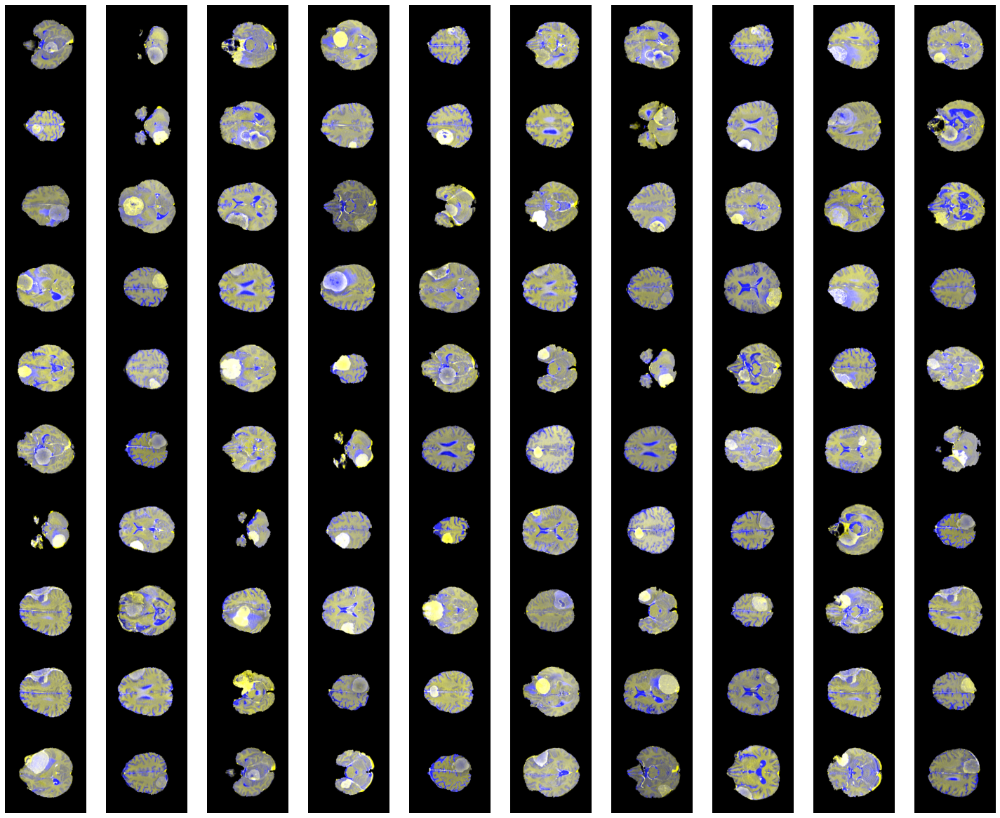

In [182]:
f, axarr = plt.subplots(10, 10, sharex=True, sharey=True, figsize=(20, 16))
for i in range(10):
    for j in range(10):
        axarr[i, j].imshow(x_asan[10*i+j], cmap='gray') #3 channel 한 번에 띄우면 이미지가 이상해ㅜ
        axarr[i, j].axis('off')
plt.subplots_adjust(wspace=0, hspace=0, left=0, right=1, bottom=0, top=1)
plt.show()

## 5. Modeling

In [155]:
# Single
asan_proba= []
for m in model:
    proba = m.predict(x_asan)
    asan_proba.append(proba)
    
asan_pred = []
for s in asan_proba:
    proba = (s > 0.5).astype(np.int64)
    asan_pred.append(proba)
    

# Ensemble
asan_results = np.zeros( (x_asan.shape[0],2) )
for s in asan_proba:
    asan_results = asan_results + s

asan_y_proba = asan_results/5
asan_y_pred = (asan_y_proba > 0.5).astype(np.int64)

[[184 261]
 [109  76]] 

Acc 0.4127
Sensitivity 0.4108
Specificity 0.4135
AUROC 0.3576
Precision 0.2255
Recall 0.4108
F1 0.2912
Weighted accuracy 0.4121 

              precision    recall  f1-score   support

           0       0.63      0.41      0.50       445
           1       0.23      0.41      0.29       185

   micro avg       0.41      0.41      0.41       630
   macro avg       0.43      0.41      0.39       630
weighted avg       0.51      0.41      0.44       630
 samples avg       0.41      0.41      0.41       630



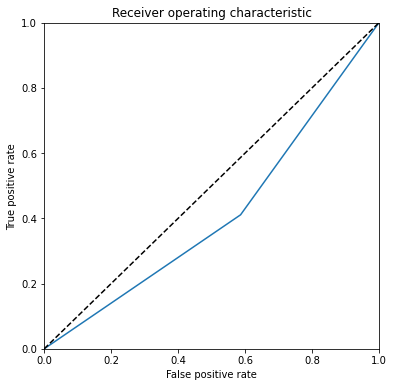

In [156]:
matrix(y_asan, asan_y_pred, asan_y_proba)

In [157]:
asan_entropy = []
for i in range(len(asan_y_proba)):
    pq = asan_y_proba[i] * y_asan[i]
    index = np.argmax(pq)
    p = pq[index]
    entropy = -p*math.log(p) - (1-p)*math.log(1-p+ 0.00000000001)
    asan_entropy.append(entropy)
    
asan_single_entropy = []
for i in range(len(asan_proba[4])):
    pq = asan_proba[4][i] * y_asan[i]
    index = np.argmax(pq)
    p = pq[index]
    entropy = -p*math.log(p) - (1-p)*math.log(1-p+ 0.00000000001)
    asan_single_entropy.append(entropy)

In [167]:
asan_high, asan_low = uc_grouping(asan_entropy, cutoff=0.25)

In [ ]:
print "%.2f%%" % (33.0 / 100.0 * 100.0)

In [176]:
print("Asan Uncertainty High: %.2f%%" % (len(asan_high) / len(asan_entropy) * 100.0))
print("Asan Uncertainty Low: %.2f%%" % (len(asan_low) / len(asan_entropy) * 100.0))

Asan Uncertainty High: 75.08%
Asan Uncertainty Low: 24.92%


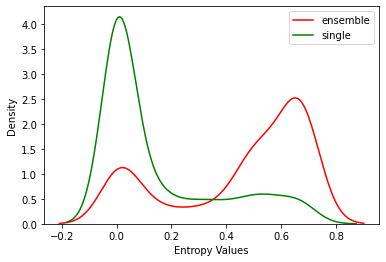

In [158]:
sns.kdeplot(np.array(asan_entropy), label='ensemble', color='r')
sns.kdeplot(np.array(asan_single_entropy), label='single', color='g')
plt.xlabel('Entropy Values')
plt.legend()
plt.show()

In [159]:
# Single
ewha_proba= []
for m in model:
    proba = m.predict(x_ewha)
    ewha_proba.append(proba)
    
ewha_pred = []
for s in ewha_proba:
    proba = (s > 0.5).astype(np.int64)
    ewha_pred.append(proba)
    

# Ensemble
ewha_results = np.zeros( (x_ewha.shape[0],2) )
for s in ewha_proba:
    ewha_results = ewha_results + s

ewha_y_proba = ewha_results/5
ewha_y_pred = (ewha_y_proba > 0.5).astype(np.int64)

[[ 89 146]
 [ 22  53]] 

Acc 0.4581
Sensitivity 0.7067
Specificity 0.3787
AUROC 0.5689
Precision 0.2663
Recall 0.7067
F1 0.3869
Weighted accuracy 0.5427 

              precision    recall  f1-score   support

           0       0.80      0.38      0.51       235
           1       0.27      0.71      0.39        75

   micro avg       0.46      0.46      0.46       310
   macro avg       0.53      0.54      0.45       310
weighted avg       0.67      0.46      0.48       310
 samples avg       0.46      0.46      0.46       310



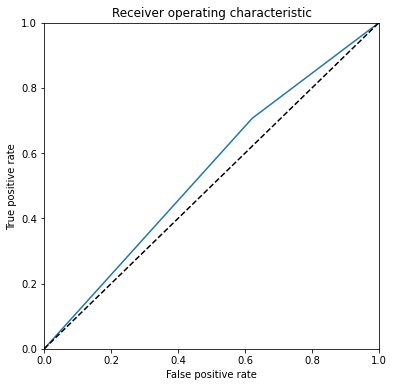

In [160]:
matrix(y_ewha, ewha_y_pred, ewha_y_proba)

In [161]:
ewha_entropy = []
for i in range(len(ewha_y_proba)):
    pq = ewha_y_proba[i] * y_ewha[i]
    index = np.argmax(pq)
    p = pq[index]
    entropy = -p*math.log(p) - (1-p)*math.log(1-p+ 0.00000000001)
    ewha_entropy.append(entropy)
    
ewha_single_entropy = []
for i in range(len(ewha_proba[4])):
    pq = ewha_proba[4][i] * y_ewha[i]
    index = np.argmax(pq)
    p = pq[index]
    entropy = -p*math.log(p) - (1-p)*math.log(1-p+ 0.00000000001)
    ewha_single_entropy.append(entropy)

In [169]:
ewha_high, ewha_low = uc_grouping(ewha_entropy, cutoff=0.25)

In [177]:
print("Ewha Uncertainty High: %.2f%%" % (len(ewha_high) / len(ewha_entropy) * 100.0))
print("Ewha Uncertainty Low: %.2f%%" % (len(ewha_low) / len(ewha_entropy) * 100.0))

Ewha Uncertainty High: 66.77%
Ewha Uncertainty Low: 33.23%


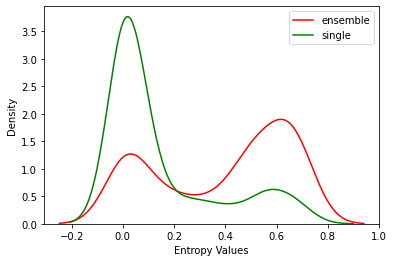

In [162]:
sns.kdeplot(np.array(ewha_entropy), label='ensemble', color='r')
sns.kdeplot(np.array(ewha_single_entropy), label='single', color='g')
plt.xlabel('Entropy Values')
plt.legend()
plt.show()

In [163]:
# Single
sev_proba= []
for m in model:
    proba = m.predict(x_sev)
    sev_proba.append(proba)
    
sev_pred = []
for s in sev_proba:
    proba = (s > 0.5).astype(np.int64)
    sev_pred.append(proba)
    

# Ensemble
sev_results = np.zeros( (x_sev.shape[0],2) )
for s in sev_proba:
    sev_results = sev_results + s

sev_y_proba = sev_results/5
sev_y_pred = (sev_y_proba > 0.5).astype(np.int64)

[[249 561]
 [209 266]] 

Acc 0.4008
Sensitivity 0.56
Specificity 0.3074
AUROC 0.4247
Precision 0.3216
Recall 0.56
F1 0.4086
Weighted accuracy 0.4337 

              precision    recall  f1-score   support

           0       0.54      0.31      0.39       810
           1       0.32      0.56      0.41       475

   micro avg       0.40      0.40      0.40      1285
   macro avg       0.43      0.43      0.40      1285
weighted avg       0.46      0.40      0.40      1285
 samples avg       0.40      0.40      0.40      1285



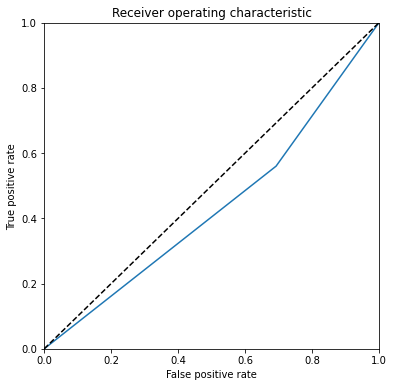

In [164]:
matrix(y_sev, sev_y_pred, sev_y_proba)

In [165]:
sev_entropy = []
for i in range(len(sev_y_proba)):
    pq = sev_y_proba[i] * y_sev[i]
    index = np.argmax(pq)
    p = pq[index]
    entropy = -p*math.log(p) - (1-p)*math.log(1-p+ 0.00000000001)
    sev_entropy.append(entropy)
    
sev_single_entropy = []
for i in range(len(sev_proba[4])):
    pq = sev_proba[4][i] * y_sev[i]
    index = np.argmax(pq)
    p = pq[index]
    entropy = -p*math.log(p) - (1-p)*math.log(1-p+ 0.00000000001)
    sev_single_entropy.append(entropy)

In [171]:
sev_high, sev_low = uc_grouping(sev_entropy, cutoff=0.25)

In [178]:
print("Severance Uncertainty High: %.2f%%" % (len(sev_high) / len(sev_entropy) * 100.0))
print("Severance Uncertainty Low: %.2f%%" % (len(sev_low) / len(sev_entropy) * 100.0))

Severance Uncertainty High: 55.10%
Severance Uncertainty Low: 44.90%


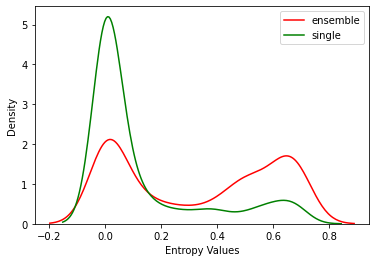

In [166]:
sns.kdeplot(np.array(sev_entropy), label='ensemble', color='r')
sns.kdeplot(np.array(sev_single_entropy), label='single', color='g')
plt.xlabel('Entropy Values')
plt.legend()
plt.show()